<div align="center">
  <img src="data/Booking.Com-logo.png" width="400">
</div>

# <center> Проект: Предсказание рейтинга отеля на Booking

***
<center> 

***Какой кейс решаем?***

***

Представим, что мы работаем дата-сайентистом в компании Booking. Одна из проблем компании — это нечестные отели, которые накручивают себе рейтинг. Одним из способов обнаружения таких отелей является построение модели, которая предсказывает рейтинг отеля. Если предсказания модели сильно отличаются от фактического результата, то, возможно, отель ведёт себя нечестно, и его стоит проверить.





## 🎯 Цель проекта

Определить ключевые закономерности в данных и создать эффективную модель, способную предсказывать настоящий рейтинг отеля.

---

## 🧩 Задачи проекта

- Загрузить и предварительно изучить данные.
- Провести очистку данных.
- Провести разведочный анализ данных (EDA).
- Проанализировать взаимосвязи между признаками.
- Выполнить отбор признаков и/или их трансформацию.
- Провести Feature Engineering (создание новых информативных признаков).
- Подготовить данные для моделирования (нормализация, кодирование и т. д.).
- Построить и обучить модель машинного обучения.
- Оценить качество модели.
- Интерпретировать результаты и сделать выводы.

---

## 🛠️ Этапы работы

1. **Импорт библиотек и загрузка данных**  
   `pandas`, `numpy`, `matplotlib`, `seaborn` и др.

2. **Предварительный анализ структуры данных**  
   Размерность, типы признаков, наличие пропусков.

3. **Очистка данных**  
   Обработка пропусков, приведение к нужным форматам.

4. **Exploratory Data Analysis (EDA)**  
   Гистограммы, boxplot, тепловые карты корреляции, распределения, анализ категориальных признаков.

5. **Feature Engineering**  
   Создание новых признаков, логические признаки.

6. **Подготовка данных для модели**  
   - Кодирование категориальных переменных 
   - Оценка корреляций между признаками и целевой переменной  
   - Анализ важности признаков (feature importance)  
   - Удаление слабоинформативных или избыточных признаков
   - Нормализация

7. **Построение модели**  
   Выбор алгоритма Random Forest и обучение с подобранными параметрами.

8. **Оценка модели**  
   Оценка качества модели с помощью метрики MAPE.

---

Первоначальная версия датасета содержит 17 полей со следующей информацией:

* hotel_address — адрес отеля;
* review_date — дата, когда рецензент разместил соответствующий отзыв;
* average_score — средний балл отеля, рассчитанный на основе последнего комментария за последний год;
* hotel_name — название отеля;
* reviewer_nationality — страна рецензента;
* negative_review — отрицательный отзыв, который рецензент дал отелю;
* review_total_negative_word_counts — общее количество слов в отрицательном отзыв;
* positive_review — положительный отзыв, который рецензент дал отелю;
* review_total_positive_word_counts — общее количество слов в положительном отзыве;
* reviewer_score — оценка, которую рецензент поставил отелю на основе своего опыта;
* total_number_of_reviews_reviewer_has_given — количество отзывов, которые рецензенты дали в прошлом;
* total_number_of_reviews — общее количество действительных отзывов об отеле;
* tags — теги, которые рецензент дал отелю;
* days_since_review — количество дней между датой проверки и датой очистки;
* additional_number_of_scoring — есть также некоторые гости, которые просто поставили оценку сервису, но не оставили отзыв. Это число указывает, сколько там действительных оценок без проверки.
* lat — географическая широта отеля;
* lng — географическая долгота отеля.

### Подготовительные работы

In [238]:
# Импорт библиотек
import numpy as np 
import pandas as pd 

# импортируем библиотеки для визуализации
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder

from ydata_profiling import ProfileReport

# Загружаем инструмент для разделения датасета:
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели
from sklearn import metrics # инструменты для оценки точности модели
from sklearn.preprocessing import RobustScaler

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
# Устанавливаем глобальную палитру
sns.set_palette("rocket")

# импорт анализаторов текстовых признаков
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob

import re


In [239]:
# фиксируем RANDOM_SEED, чтобы эксперименты были воспроизводимы
RANDOM_SEED = 42

In [240]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

In [241]:
# Подгрузим наши данные из соревнования

# DATA_DIR = '/kaggle/input/sf-booking/'
# df_train = pd.read_csv(DATA_DIR+'/hotels_train.csv') # датасет для обучения
# df_test = pd.read_csv(DATA_DIR+'hotels_test.csv') # датасет для предсказания
# sample_submission = pd.read_csv(DATA_DIR+'/submission.csv') # самбмишн

In [242]:
DATA_DIR = '/data'
df_train = pd.read_csv('data/hotels_train.csv') # датасет для обучения
df_test = pd.read_csv('data/hotels_test.csv') # датасет для предсказания
sample_submission = pd.read_csv('data/submission.csv') # самбмишн

In [243]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

In [244]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               128935 non-null  object 
 1   additional_number_of_scoring                128935 non-null  int64  
 2   review_date                                 128935 non-null  object 
 3   average_score                               128935 non-null  float64
 4   hotel_name                                  128935 non-null  object 
 5   reviewer_nationality                        128935 non-null  object 
 6   negative_review                             128935 non-null  object 
 7   review_total_negative_word_counts           128935 non-null  int64  
 8   total_number_of_reviews                     128935 non-null  int64  
 9   positive_review                             128935 non-null  object 
 

In [245]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 2 columns):
 #   Column          Non-Null Count   Dtype
---  ------          --------------   -----
 0   reviewer_score  128935 non-null  int64
 1   id              128935 non-null  int64
dtypes: int64(2)
memory usage: 2.0 MB


In [246]:
# ВАЖНО! для корректной обработки признаков объединяем трейн и тест в один датасет
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['reviewer_score'] = 0 # в тесте у нас нет значения reviewer_score, мы его должны предсказать, по этому пока просто заполняем нулями

data = pd.concat([df_test, df_train], ignore_index=True, sort=False)

In [247]:
# Устанавливаем уровень значимости
alpha = 0.05

# Функция для принятия решения о нормальности распределения
def decision_normality(p):
    """
    Функция выводит решение о нормальности распределения на основе p-значения.

    Параметры:
    p (float): p-значение, полученное из теста на нормальность.
    """
    print(f'p-value = {p:.3f}')
    if p <= alpha:
        print(f'p-значение меньше, чем заданный уровень значимости {alpha:.2f}. '
              f'Распределение отлично от нормального.')
    else:
        print(f'p-значение больше, чем заданный уровень значимости {alpha:.2f}. '
              f'Распределение является нормальным.')

# Функция для принятия решения об отклонении нулевой гипотезы
def decision_hypothesis(p):
    """
    Функция выводит решение о нулевой гипотезе на основе p-значения.

    Параметры:
    p (float): p-значение, полученное из статистического теста.
    """
    print(f'p-value = {p:.3f}')
    if p < alpha:
        print(f'p-значение меньше, чем заданный уровень значимости {alpha:.2f}. '
              f'Отвергаем нулевую гипотезу в пользу альтернативной.')
    
    else:
        print(f'p-значение больше, чем заданный уровень значимости {alpha:.2f}. '
              f'У нас нет оснований отвергнуть нулевую гипотезу.')
        
def decision_hypothesis_short(p, alpha=0.05):
    return 'Отклоняем H₀' if p < alpha else 'Не отклоняем H₀'

In [248]:
def stat_test(test, groups, alt='two-sided', verbose=True):
    """
    Универсальная функция для проведения статистических тестов.

    Параметры:
    test (str): Название теста ('ttest_ind', 'mannwhitneyu', 'sign_test', 'wilcoxon', 'kruskal', 'friedman').
    groups (tuple of array-like): Две или более выборок.
    alt (str): Альтернатива ('two-sided', 'less', 'greater').
    verbose (bool): Если True — использовать подробную версию вывода. Если False — короткую.
    alpha (float): Уровень значимости.

    Возвращает:
    str: Решение о гипотезе.
    """
    if test == 'ttest_ind':
        _, p = stats.ttest_ind(*groups, equal_var=False, alternative=alt)
    elif test == 'mannwhitneyu':
        _, p = stats.mannwhitneyu(*groups, alternative=alt)
    elif test == 'sign_test':
        _, p = stats.descriptivestats.sign_test(*groups, alternative=alt)
    elif test == 'wilcoxon':
        _, p = stats.wilcoxon(*groups, alternative=alt)
    elif test == 'kruskal':
        _, p = stats.kruskal(*groups)
    elif test == 'friedman':
        _, p = stats.friedmanchisquare(*groups)
    else:
        raise ValueError(f"Неизвестный тест: {test}")
    
    # Выбор функции в зависимости от флага verbose
    if verbose:
        return decision_hypothesis(p)
    else:
        return decision_hypothesis_short(p, alpha=alpha)

In [249]:
def shapiro(group, i):
    """
    Проводит тест Шапиро-Уилка для проверки нормальности распределения в группе.

    Параметры:
    group (array-like): Группа данных, которую необходимо проверить на нормальность.
    i (int): Номер группы для вывода информации.

    Возвращает:
    None: Функция не возвращает значение, но выводит результаты теста и решение о нормальности.
    """
    # Выводим номер группы
    print(f'Группа {i}: ')

    # Выполняем тест Шапиро-Уилка
    result = stats.shapiro(group)

    # Передаем p-значение в функцию для принятия решения о нормальности
    decision_normality(result[1])

Так как у нас большие выборки, значимость эффекта также будем проверять коэффициентом Клайна. Чтобы оценить насколько сильно группы отличаются друг от друга

In [250]:
def cohens(group1, group2):
    """
    Функция рассчитывает коэффициент Клайна (Cohen's d) между двумя группами данных.

    Параметры:
    group1 (array-like): Первая группа данных.
    group2 (array-like): Вторая группа данных.

    Возвращает:
    str: Строка с результатом расчета коэффициента Клайна и уровнем эффекта.
    """
    # Рассчитаем медианы обеих групп
    median1 = np.median(group1)
    median2 = np.median(group2)

    # Рассчитаем разницу медиан
    median_diff = median1 - median2

    # Рассчитаем объединенную дисперсию для непараметрического Cohen's d
    pooled_std = np.sqrt((np.var(group1, ddof=1) + np.var(group2, ddof=1)) / 2)

    # Рассчитаем Cohen's d
    cohens_d = abs(median_diff / pooled_std)

    # Определим уровень эффекта на основе значения Cohen's d
    if cohens_d < 0.2:
        level = 'незначительный'
    elif 0.2 <= cohens_d < 0.4:
        level = 'малый'
    elif 0.4 <= cohens_d < 0.6:
        level = 'средний'
    elif 0.6 <= cohens_d < 0.8:
        level = 'большой'
    else:
        level = 'очень большой'

    # Формируем результат в виде строки
    result = f"Cohen's d: {round(cohens_d, 1)}, уровень эффекта: {level}"

    return result

Чтобы визуально оценить распределение групп, которые сравниваем. Создадим для визуализации функцию

In [251]:
def pie_bar(name, title, x_name):
    """
    Функция строит круговую диаграмму и барплот для заданного признака.

    Параметры:
    name (str): Имя столбца данных, который нужно визуализировать.
    title (str): Заголовок графика.
    x_name (str): Название оси X для барплота.
    """
    # Создаем фигуру с двумя подграфиками
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Считаем количество значений для каждого уникального значения в столбце 'name'
    counts = data[data['sample'] == 1][name].value_counts()

    # Получаем цвета из палитры seaborn
    pie_colors = sns.color_palette("rocket", len(counts))

    # Строим круговую диаграмму
    axes[0].pie(
        counts,          
        labels=counts.index,  
        startangle=90,      
        autopct='%1.f%%',
        colors=pie_colors
    )
    axes[0].set_title(title)     
    
    # Группируем данные по значению 'name' и вычисляем медиану оценки
    group = data[data['sample'] == 1].groupby(name)['reviewer_score'].median().reset_index()

    # Строим барплот для признака (использует глобальную палитру)
    sns.barplot(
        x=group[name],     
        y=group['reviewer_score'],  
        ax=axes[1]
    )
    
        # Добавляем аннотацию на барплот
    for i in range(len(group)):
        axes[1].text(
            group[name].iloc[i], 
            group['reviewer_score'].iloc[i], 
            f'{group["reviewer_score"].iloc[i]:.2f}',  # Форматируем значение
            ha='center', 
            va='bottom', 
            fontsize=10
        )
        
    axes[1].set_title(title)    
    axes[1].set_xlabel(x_name) 
    axes[1].set_ylabel('Оценка')
    plt.tight_layout()


In [252]:
# Создадим пустой список для добавления туда признаков, которые нужно будет удалить
drop_list = []

# 1. Предварительное исследование исходных данных

Воспользуемся библиотекой YData для ссоздания репорта

In [253]:
profile = ProfileReport(data, title='Pandas Profiling Report')
profile.to_file('report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [254]:
profile

* Датасет имеет 515738 строк и 18 признаков;
* Общее количество пропущенных значений: 6536, они находятся в признаках 'lat' и 'lng';
* Есть 336 дубликатов, но не будем их удалять, дабы не нарушить размерность таблицы;
* Таблица имеет:
   - 1 категориальный бинарный признак 'sample', созданный нами
   - 1 признак даты: 'review_date'
   - 7 категориальных признаков с текстом: 'hotel_address', 'hotel_name', 'reviewer_nationality', 'negative_review', 'positive_review', 'tags', 'days_since_review';
   - 9 числовых признаков: 'additional_number_of_scoring', 'average_score', 'review_total_negative_word_counts', 'total_number_of_reviews', 'review_total_positive_word_counts', 'total_number_of_reviews_reviewer_has_given', 'lat', 'lng', 'reviewer_score'

# 2. Очистка данных от пропущенных значений

Очистим прзнаки 'lag' и 'lng' от пропусков, для этого найдем уникальные адреса, для которых не хватает координат, добавим недостающие координаты вручную и заполним все пропуски. 

In [255]:
# Ищем все уникальные адреса, где не хватает координат
missing_coords_df = data[data['lng'].isnull()]['hotel_address'].unique()
missing_coords_df

array(['W hringer Stra e 33 35 09 Alsergrund 1090 Vienna Austria',
       'Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria',
       '23 Rue Damr mont 18th arr 75018 Paris France',
       'Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria',
       'Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria',
       'Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria',
       'Bail n 4 6 Eixample 08010 Barcelona Spain',
       'Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria',
       '4 rue de la P pini re 8th arr 75008 Paris France',
       '20 Rue De La Ga t 14th arr 75014 Paris France',
       'W hringer Stra e 12 09 Alsergrund 1090 Vienna Austria',
       'Savoyenstra e 2 16 Ottakring 1160 Vienna Austria',
       'Pau Clar s 122 Eixample 08009 Barcelona Spain',
       'Sieveringer Stra e 4 19 D bling 1190 Vienna Austria',
       'Paragonstra e 1 11 Simmering 1110 Vienna Austria',
       'Hasenauerstra e 12 19 D bling 1190 Vienna Austria',
       'Sep lveda 180 Eix

In [256]:
# Создаем словарь адресов с правильными координатами
known_coords = {
    'W hringer Stra e 33 35 09 Alsergrund 1090 Vienna Austria': (48.220662, 16.355555),
    'Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria': (48.220920, 16.366712),
    '23 Rue Damr mont 18th arr 75018 Paris France': (48.888887, 2.333167),
    'Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria': (48.209333, 16.354036),
    'Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria': (48.213836, 16.380043),
    'Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria': (48.209477, 16.351350),
    'Bail n 4 6 Eixample 08010 Barcelona Spain': (41.397357, 2.169952),
    'Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria': (48.188578, 16.382747),
    '4 rue de la P pini re 8th arr 75008 Paris France': (48.875260, 2.323403),
    '20 Rue De La Ga t 14th arr 75014 Paris France': (48.839813, 2.323573),
    'W hringer Stra e 12 09 Alsergrund 1090 Vienna Austria': (48.216700, 16.359983),
    'Savoyenstra e 2 16 Ottakring 1160 Vienna Austria': (48.220050, 16.284974),
    'Pau Clar s 122 Eixample 08009 Barcelona Spain': (41.392967, 2.166718),
    'Sieveringer Stra e 4 19 D bling 1190 Vienna Austria': (48.245935, 16.341397),
    'Paragonstra e 1 11 Simmering 1110 Vienna Austria': (48.186409, 16.420170),
    'Hasenauerstra e 12 19 D bling 1190 Vienna Austria': (48.233495, 16.345556),
    'Sep lveda 180 Eixample 08011 Barcelona Spain': (41.379389, 2.157475)
}

In [257]:
def add_coordinates(row, known_coords):
    """
    Функция добавляет пропущенные координаты (широту и долготу) в строку данных,
    если они отсутствуют, с использованием информации о известном адресе отеля.

    Args:
    row(pandas.Series):
        Строка данных, содержащая информацию об отеле, включая его адрес и координаты.
    known_coords(dict):
        Словарь, где ключом является адрес отеля (строка), а значением - кортеж с координатами (широта, долгота).

    Возвращает:
    row(pandas.Series)
        Строка данных с добавленными координатами, если они были найдены в словаре `known_coords`.
    """
    # Проверяем, есть ли пропуски в lat или lng
    if pd.isna(row['lat']) or pd.isna(row['lng']):
        # Если есть пропуск, пытаемся найти координаты по адресу
        coordinates = known_coords.get(row['hotel_address'])
        if coordinates:
            row['lat'], row['lng'] = coordinates
    return row

# Применение функции к каждой строке
data = data.apply(lambda row: add_coordinates(row, known_coords), axis=1)

In [258]:
# Проверяем на пропуски
print(f'Количество оставшихся пропусков: \n{data[['lat', 'lng']].isnull().sum()}')

Количество оставшихся пропусков: 
lat    0
lng    0
dtype: int64


# 3. Обработка признаков

## 3.1 Обработка признака даты

In [259]:
# Преобразуем строку даты в формат datetime
data['review_date'] = pd.to_datetime(data['review_date'])

# Извлекаем месяц из поля review_date и сохраняем в новый столбец month_review
data['month_review'] = data['review_date'].dt.month

# Извлекаем год из поля review_date и сохраняем в новый столбец year_review
data['year_review'] = data['review_date'].dt.year

# Извлекаем номер недели по ISO-календарю из поля review_date и сохраняем в новый столбец week_number
data['week_number'] = data['review_date'].dt.isocalendar().week

data['q_number'] = data['review_date'].dt.quarter

Визуализируем влияние временных признаков на рейтинг отеля

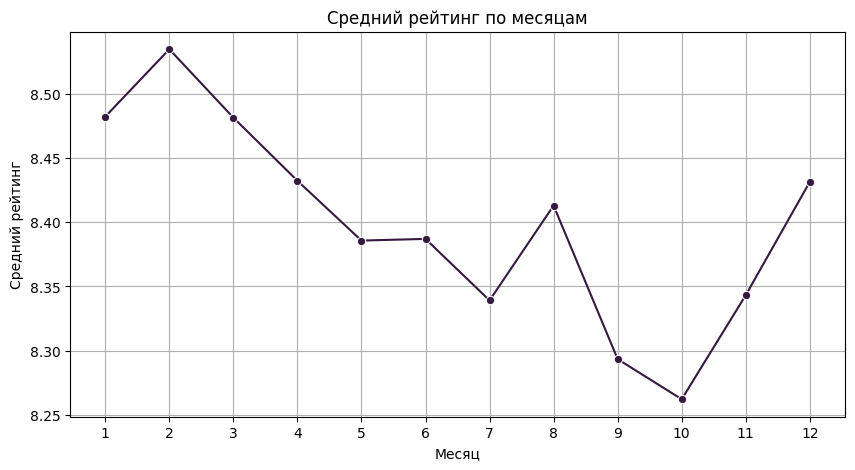

In [260]:
# Средний рейтинг по каждому месяцу
monthly_avg = data[data['sample'] == 1].groupby('month_review')['reviewer_score'].mean().reset_index()

plt.figure(figsize=(10, 5))
sns.lineplot(data=monthly_avg, x='month_review', y='reviewer_score', marker='o')
plt.title('Средний рейтинг по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Средний рейтинг')
plt.xticks(range(1, 13))
plt.grid(True)
plt.show()


In [261]:
# Расчет медианного рейтинга по годам и месяцам
average_rating = data[data['sample'] == 1].groupby(['year_review', 'month_review'])['reviewer_score'].median().unstack().reset_index().fillna(0)
average_rating.columns = ['year', 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
average_rating

,year,1,2,3,4,5,6,7,8,9,10,11,12
0,2015,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.8,8.8,8.8,8.8,8.8
1,2016,9.2,9.2,9.2,8.8,8.8,8.8,8.8,8.8,8.8,8.8,8.8,8.8
2,2017,9.2,9.2,8.8,8.8,8.8,8.8,8.8,8.8,0.0,0.0,0.0,0.0


Высокие рейтинги в первые 3 месяца года, создадим признак маячок, который укажет, размещен ли отзыв в эти месяцы или нет

In [262]:
data['is_first_three_month'] = data['month_review'].apply(lambda x: 1 if x in [1, 2, 3] else 0)


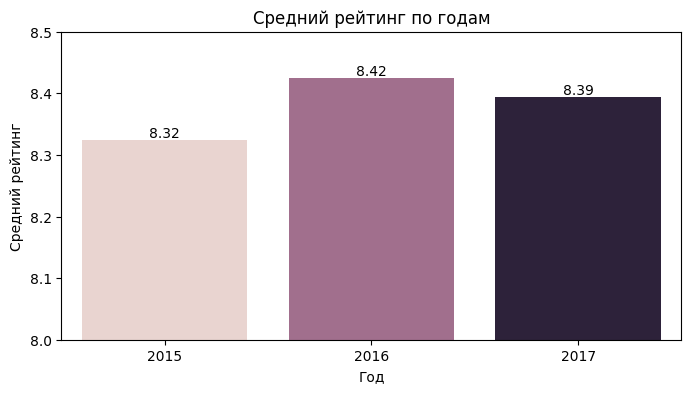

In [263]:
# Средний рейтинг по годам
quarterly_avg =data[data['sample'] == 1].groupby('year_review')['reviewer_score'].mean().reset_index()

plt.figure(figsize=(8, 4))
ax = sns.barplot(data=quarterly_avg, x='year_review', y='reviewer_score', hue='year_review', legend=False)

# Добавляем аннотации
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2, height),
                ha='center', va='bottom', fontsize=10)
    
plt.title('Средний рейтинг по годам')
plt.xlabel('Год')
plt.ylabel('Средний рейтинг')
plt.ylim(8, 8.5)
plt.show()

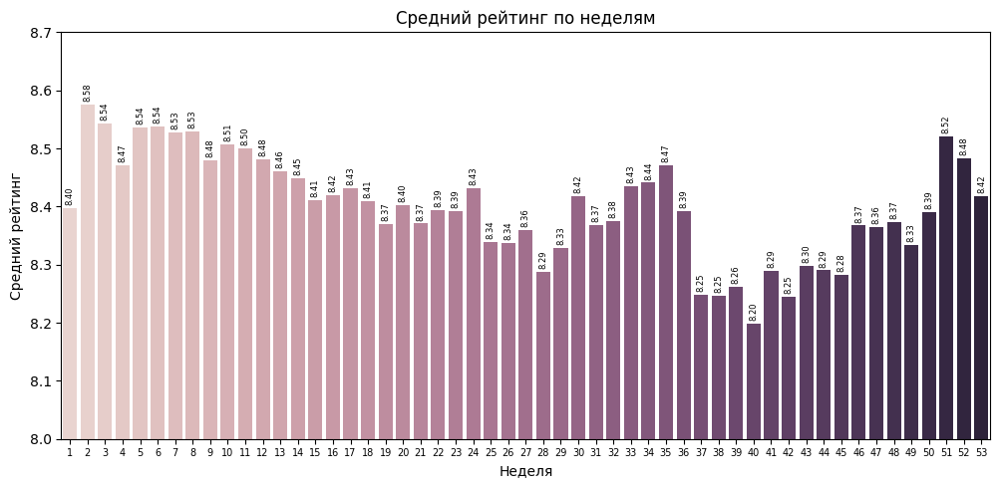

In [264]:
# Средний рейтинг по неделям
# Группировка данных
weekly_avg = data[data['sample'] == 1].groupby('week_number')['reviewer_score'].mean().reset_index()

# Визуализация
plt.figure(figsize=(10, 5))
barplot = sns.barplot(data=weekly_avg, x='week_number', y='reviewer_score', hue='week_number', legend=False)

# Добавление аннотаций
for index, row in weekly_avg.iterrows():
    plt.text(x=index, 
             y=row['reviewer_score'] + 0.005, 
             s=f"{row['reviewer_score']:.2f}", 
             ha='center', 
             va='bottom', 
             fontsize=6,
             rotation=90)

# Настройки графика
plt.title('Средний рейтинг по неделям')
plt.xlabel('Неделя')
plt.ylabel('Средний рейтинг')
plt.xticks(fontsize=7)
plt.tight_layout()
plt.ylim(8, 8.7)
plt.show()

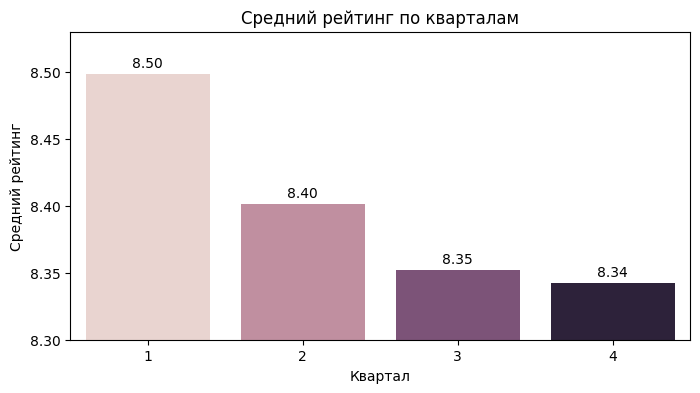

In [265]:
# Средний рейтинг по кварталам
# Группировка данных
quarterly_avg = data[data['sample'] == 1].groupby('q_number')['reviewer_score'].mean().reset_index()

# Построение графика
plt.figure(figsize=(8, 4))
barplot = sns.barplot(data=quarterly_avg, x='q_number', y='reviewer_score', hue='q_number', legend=False)

# Добавление аннотаций
for index, row in quarterly_avg.iterrows():
    plt.text(x=index, 
             y=row['reviewer_score'] + 0.005,  # немного выше столбика
             s=f"{row['reviewer_score']:.2f}",  # округление до 2 знаков
             ha='center')
    
# Настройки графика
plt.title('Средний рейтинг по кварталам')
plt.xlabel('Квартал')
plt.ylabel('Средний рейтинг')
plt.ylim(8.3, 8.53)
plt.show()

Проверим статистическую значимость созданных признаков:

**Сформулируем нулевую и альтернативные гипотезы**

1. *Нулевая гипотеза* ($H_0$): Средняя оценка отеля не имеет статистических различий в зависимости от года

   *Альтернативная гипотеза* ($H_1$): Средняя оценка отеля имеет статистические различия в зависимости от года   


2. *Нулевая гипотеза* ($H_0$): Средняя оценка отеля не имеет статистических различий в зависимости от месяца

   *Альтернативная гипотеза* ($H_1$): Средняя оценка отеля имеет статистические различия в зависимости от месяца


3. *Нулевая гипотеза* ($H_0$): Средняя оценка отеля не имеет статистических различий в зависимости от номера недели

   *Альтернативная гипотеза* ($H_1$): Средняя оценка отеля имеет статистические различия в зависимости от номера недели

   
4. *Нулевая гипотеза* ($H_0$): Средняя оценка отеля не имеет статистических различий в зависимости от квартала

   *Альтернативная гипотеза* ($H_1$): Средняя оценка отеля имеет статистические различия в зависимости от квартала
 




In [266]:
# Тест на нормальность для всех данных
group = data['reviewer_score']

# Проводим тест Шапиро-Уилка для всех данных
result = stats.shapiro(group)

# Выводим результаты теста
decision_normality(result[1])


p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.


c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 515738.
  res = hypotest_fun_out(*samples, **kwds)


Каждое распределение не нормальное, 3 и более группы, группы независимы - выбираем критерий Краскала-Уоллиса для всех распределений

In [267]:
# Функция для проверки значимости категориального признака
def check_significance(group_column, test_func=stats.kruskal):
    """
    Функция для проверки статистической значимости категориальных признаков.
    
    Параметры:
    group_column (str): Название столбца, по которому делается группировка.
    test_func: Функция для тестирования значимости (по умолчанию Краскал-Уоллис).
    """
    # Группируем данные по значению столбца и получаем значения для теста
    groups = [group['reviewer_score'].values for _, group in data.groupby(group_column)]
    
    # Применяем тест
    stat, p = test_func(*groups)
    
    # Выводим p-value и решение о значимости
    print(f"{group_column}: p-value = {p:.4f} {'p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной' if p < 0.05 else 'p-значение больше, чем заданный уровень значимости {alpha:.2f}. '
              f'У нас нет оснований отвергнуть нулевую гипотезу.'}")

# Проверим все признаки
check_significance('month_review')
check_significance('year_review')
check_significance('q_number')
check_significance('week_number')

month_review: p-value = 0.0000 p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной
year_review: p-value = 0.0000 p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной
q_number: p-value = 0.0000 p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной
week_number: p-value = 0.0000 p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной


Вывод:

Средняя оценка отеля статистически зависит от созднанных нами признаков

In [ ]:
# Добавляем в список удаления изначальный признак
drop_list.append('review_date')

## 3.2. Обработка категориальных признаков

В датасете есть 7 категориальных признаков с текстом: 'hotel_address', 'hotel_name', 'reviewer_nationality', 'negative_review', 'positive_review', 'tags', 'days_since_review';

### 3.2.1 Сначала извлечем все полезные данные из признака 'hotel_address'

#### Создадим признаки города и страны нахождения отеля

In [269]:
data['hotel_address'].unique()[:20]


array(['Via Senigallia 6 20161 Milan Italy',
       'Arlandaweg 10 Westpoort 1043 EW Amsterdam Netherlands',
       'Mallorca 251 Eixample 08008 Barcelona Spain',
       'Piazza Della Repubblica 17 Central Station 20124 Milan Italy',
       'Singel 303 309 Amsterdam City Center 1012 WJ Amsterdam Netherlands',
       'Coram Street Camden London WC1N 1HT United Kingdom',
       'Empire Way Wembley Brent London HA9 8DS United Kingdom',
       '1 Shortlands Hammersmith and Fulham London W6 8DR United Kingdom',
       '35 Rue Caumartin 9th arr 75009 Paris France',
       '49 Gloucester Place Marble Arch Westminster Borough London W1U 8JE United Kingdom',
       'Via Giorgio Stephenson 55 20157 Milan Italy',
       'Spaarndammerdijk 304 Westerpark 1013 ZX Amsterdam Netherlands',
       'Damrak 1 5 Amsterdam City Center 1012 LG Amsterdam Netherlands',
       'Caspe 103 Eixample 08013 Barcelona Spain',
       'Via Napo Torriani 24 Central Station 20124 Milan Italy',
       'Oudeschans 75 Amste

Проанализировав адреса отелей можно выделить 6 стран и 6 городов, в которых расположены отели:

In [270]:
# если адрес заканчивается на Kingdom присваиваем 'United Kingdom', в остальных случаях проcто берем последний элемент, он и есть название страны
data['hotel_country'] = data['hotel_address'].apply(
    lambda x: 'United Kingdom' if x.strip().endswith('Kingdom')
    else x.strip().split(' ')[-1]
    )

# Проверяем новый столбец
data['hotel_country'].unique()

array(['Italy', 'Netherlands', 'Spain', 'United Kingdom', 'France',
       'Austria'], dtype=object)

In [271]:
# аналогично с признаком города, если адрес заканчивается на 'Kingdom' присваиваем 5 элемент с конца, в остальных случаях город на 2 позиции с конца строки
data['hotel_city'] = data['hotel_address'].apply(
    lambda x: x.split(' ')[-5] if x.strip().endswith('Kingdom') 
    else x.split(' ')[-2]
)

# Проверяем новый столбец
data['hotel_city'].unique()

array(['Milan', 'Amsterdam', 'Barcelona', 'London', 'Paris', 'Vienna'],
      dtype=object)

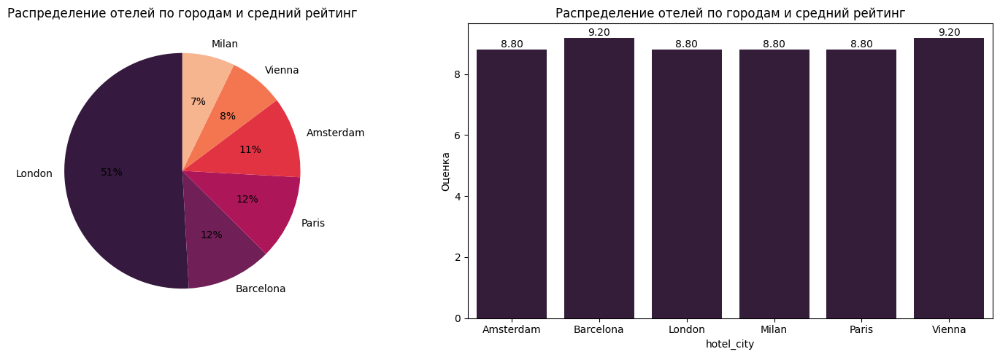

In [272]:
# Смотрим распределение отелей по городам
pie_bar('hotel_city', 'Распределение отелей по городам и средний рейтинг', 'hotel_city')

Половину наших данных составляют отели, находящиеся в Лондоне. Остальные города имеют приблизительно одинаковое количество данных.

Во всех городах из данных примерно одинаковый средний уровень оценок отелей. Но у отелей из Барселоны и Вены прослеживаются более высокие оценки. 

Проверим является ли это предположение статистически важным.

*Нулевая гипотеза* ($H_0$): У отелей из Барселоны и Вены оценки равны или ниже оценкам остальных отелей.

*Альтернативная гипотеза* ($H_1$): У отелей из Барселоны и Вены оценки выше, чем у остальных отелей.

In [273]:
# Выделяем группы для сравнения 
bars_v = data.loc[(data['sample'] == 1) & (data['hotel_city'].isin(['Barselona', 'Vienna'])), 'reviewer_score']
other_city = data.loc[(data['sample'] == 1) & (~data['hotel_city'].isin(['Barselona', 'Vienna'])), 'reviewer_score']

# Проверяем нормальность распределения
shapiro(bars_v, 1)
shapiro(other_city, 2)

Группа 1: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 2: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.


c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 29178.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 357625.
  res = hypotest_fun_out(*samples, **kwds)


In [274]:
# У нас 2 группы, независимы, признак количественный - выбираем Манна-Уитни
stat_test('mannwhitneyu', [bars_v, other_city], alt='greater')

# считаем коэффициент Клайна для количественной оценки разницы между 2 группами
cohens(bars_v, other_city)

p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


"Cohen's d: 0.3, уровень эффекта: малый"

Вывод: 

Статистичиские различия есть, но небольшие, оставим для работы

In [275]:
# Создадим бинарный признак на основе этих данных: 1 - для отелей Вены и Барселоны, 0 - для остальных

data['bars_vienna'] = data['hotel_city'].apply(lambda x: 1 if x in ['Barselona', 'Vienna'] else 0)

In [276]:
data['bars_vienna'].value_counts()

bars_vienna
0    476799
1     38939
Name: count, dtype: int64

In [277]:
# Признак адреса можно удалить
drop_list.append('hotel_address')

### 3.2.2 Признак 'hotel_name'

Особо полезных данных здесь нет, просто удалим этот признак

In [278]:
drop_list.append('hotel_name')

### 3.2.3 Обработаем признак 'reviewer_nationality'

In [279]:
data['reviewer_nationality'].value_counts()

reviewer_nationality
United Kingdom               245246
United States of America      35437
Australia                     21686
Ireland                       14827
United Arab Emirates          10235
                              ...  
Tuvalu                            1
Cape Verde                        1
Svalbard Jan Mayen                1
Northern Mariana Islands          1
Palau                             1
Name: count, Length: 227, dtype: int64

In [280]:
data['reviewer_nationality'][0]

' United Kingdom '

Всего имеется 227 разных стран рецензентов, необходимо сократить это количество, чтобы закодировать данный признак.
Для начала исправим данные, а именно удалим пробелы перед и после страны

In [281]:

data['reviewer_nationality'] = data['reviewer_nationality'].str.strip()

Далее разделим все страны по континентам, у нас получится 6 категорий: 'Africa', 'Asia', 'Europe', 'North America', 'South America' и 'Oceania'

In [282]:

# Список стран по континентам
country_to_continent_dict = {
    'Africa': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo', 'Congo (Democratic Republic)', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Ivory Coast', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'São Tomé and Príncipe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan', 'Sudan', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Asia': ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei', 'Cambodia', 'China', 'Cyprus', 'Georgia', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'North Korea', 'Oman', 'Pakistan', 'Palestine', 'Philippines', 'Qatar', 'Russia', 'Saudi Arabia', 'Singapore', 'South Korea', 'Sri Lanka', 'Syria', 'Tajikistan', 'Thailand', 'Timor-Leste', 'Turkey', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Europe': ['Albania', 'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kazakhstan', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Turkey', 'Ukraine', 'United Kingdom', 'Vatican City'],
    'North America': ['Antigua and Barbuda', 'Bahamas', 'Barbados', 'Belize', 'Canada', 'Costa Rica', 'Cuba', 'Dominica', 'Dominican Republic', 'El Salvador', 'Grenada', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago', 'United States of America'],
    'South America': ['Argentina', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela'],
    'Oceania': ['Australia', 'Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia', 'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu']
}

# Функция для получения континента на основе страны
def country_to_continent(country_name):
    for continent, countries in country_to_continent_dict.items():
        if country_name in countries:
            return continent
    return 'Other'  # Если страна не найдена

# Применяем к колонке
data['reviewer_continent'] = data['reviewer_nationality'].apply(country_to_continent)

# Проверим результат
display(data['reviewer_continent'].value_counts())


reviewer_continent
Europe           352735
Asia              73100
North America     44664
Oceania           24965
Africa             8892
Other              7979
South America      3403
Name: count, dtype: int64

Визуализируем зависимость средней оценки отеля от континента

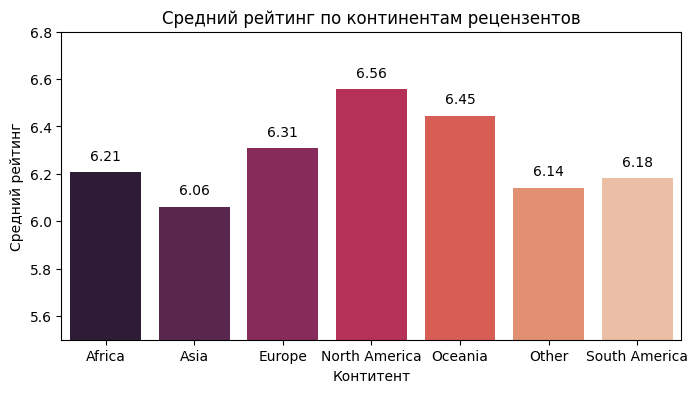

In [283]:
# Группировка данных
reviewer_continent_avg = data.groupby('reviewer_continent')['reviewer_score'].mean().reset_index()

# Построение графика
plt.figure(figsize=(8, 4))
barplot = sns.barplot(data=reviewer_continent_avg,
                      x='reviewer_continent',
                      y='reviewer_score',
                      hue='reviewer_continent',
                      legend=False,
                      palette='rocket')

# Добавление аннотаций
for index, row in reviewer_continent_avg.iterrows():
    plt.text(x=index, 
             y=row['reviewer_score'] + 0.05,  # немного выше столбика
             s=f"{row['reviewer_score']:.2f}",  # округление до 2 знаков
             ha='center')
    
# Настройки графика
plt.title('Средний рейтинг по континентам рецензентов')
plt.xlabel('Контитент')
plt.ylabel('Средний рейтинг')
plt.ylim(5.5, 6.8)
plt.show()

Из графика можно сделать предположение, что средняя оценка отеля зависит от национальности(континента) ревьюера.

Проверим является ли это предположение статистически важным.

*Нулевая гипотеза* ($H_0$): Контитент рецензента не влияет на оценку отеля.

*Альтернативная гипотеза* ($H_1$): Контитент рецензента статистически влияет на оценку отеля.

In [284]:
# данные распределены не нормально, больше 3х независимых групп - выбираем тест Краскела-Уоллиса

groups = [data[data['reviewer_continent'] == continent]['reviewer_score'] for continent in data['reviewer_continent'].unique()]
result = stat_test('kruskal', groups)


p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


Вывод:

Есть статистически значимая разница между оценками рецензентов в зависимости от континента

In [285]:
# Закодируем признак One-hot кодировкой для использования в обучении
continent_dummies = pd.get_dummies(data['reviewer_continent'], prefix='continent', drop_first=True)
data = pd.concat([data, continent_dummies], axis=1)

Попробуем разделить резидентов по другиим признакам, создадим бинарные признаки, которые будут делить резидентов на группы: 
1. Англоговорящие/нет
2. Из мусулманской страны/нет
3. Из азиатской страны/нет
4. Из ЕС(кроме англоговорящих)/нет
5. Путешествует по своей стране/нет

И далее посмотрим, какие из созданных признаков сильнее повляют на результат

In [286]:

# Выведем количество уникальных стран рецензентов
nationality_count = len(data["reviewer_nationality"].value_counts())
print(f'Представители {nationality_count} стран являются рецензентами.')

# Признак "англоязычная страна"
english_list = [
    'United Kingdom', 'United States', 'United States of America', 'Australia',
    'Ireland', 'Canada', 'New Zealand', 'Seychelles', 'Barbados', 'Jamaica',
    'Antigua and Barbuda', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago',
    'Belize', 'Saint Kitts and Nevis', 'Saint Lucia', 'Grenada', 'Guyana', 'Bahamas'
]

# Признак "мусульманская ближневосточная страна"
muslim_list = [
    'United Arab Emirates', 'Saudi Arabia', 'Turkey', 'Kuwait', 'Qatar', 'Egypt', 'Lebanon',
    'Bahrain', 'Oman', 'Jordan', 'Syria', 'Iraq', 'Palestine', 'Tunisia', 'Algeria', 'Morocco',
    'Mauritania', 'Somalia', 'Yemen', 'Libya', 'Comoros'
]

# Признак "европейские страны" (не включая англоязычные)
europe_list = [
    'Netherlands', 'Switzerland', 'Germany', 'France', 'Italy', 'Belgium',
    'Spain', 'Romania', 'Russia', 'Greece', 'Sweden', 'Poland', 'Austria',
    'Norway', 'Czech Republic', 'Hungary', 'Portugal', 'Finland', 'Estonia',
    'Latvia', 'Lithuania', 'Slovakia', 'Slovenia', 'Cyprus', 'Malta', 'Monaco', 'Andorra',
    'Armenia', 'Georgia', 'Bosnia and Herzegovina', 'Albania', 'Kosovo', 'Moldova', 'Montenegro',
    'North Macedonia', 'Belarus', 'Kosovo', 'San Marino', 'Liechtenstein', 'Luxembourg'
]

# Признак 'Азиатские страны'
asia_list = [
    'India', 'China', 'Singapore', 'Hong Kong', 'Malaysia', 'Thailand',
    'Japan', 'South Korea', 'Taiwan', 'Indonesia', 'Pakistan', 'Bangladesh', 'Sri Lanka',
    'Philippines', 'Vietnam', 'Myanmar', 'Cambodia', 'Nepal', 'Kazakhstan', 'Uzbekistan',
    'Tajikistan', 'Turkmenistan', 'Azerbaijan', 'Armenia', 'Georgia', 'Mongolia', 'Kyrgyzstan'
]

# Признак "остальные страны"
other_list = [
    'Israel', 'South Africa', 'Brazil', 'Argentina', 'Chile', 'Mexico', 'Peru', 'Ecuador',
    'Colombia', 'Venezuela', 'Paraguay', 'Uruguay', 'Cuba', 'Panama', 'Costa Rica', 'Honduras',
    'Guatemala', 'Nicaragua', 'El Salvador', 'Puerto Rico', 'Dominican Republic', 'Jamaica',
    'Cayman Islands', 'Bermuda', 'Bahamas', 'Saint Pierre and Miquelon', 'French Guiana',
    'Bonaire, Sint Eustatius and Saba', 'Falkland Islands', 'Montserrat', 'Saint Martin',
    'Sint Maarten', 'Gibraltar', 'Guernsey', 'Isle of Man', 'New Caledonia', 'Reunion',
    'American Samoa', 'Suriname', 'Turks and Caicos Islands', 'Vatican City', 'Palau', 'Tuvalu',
    'Gambia', 'Madagascar', 'Saint Barthélemy', 'Saint Pierre and Miquelon', 'Mauritius',
    'Seychelles', 'Anguilla', 'Martinique', 'Montserrat', 'Guadeloupe', 'Mayotte', 'Saint Helena',
    'Antarctica', 'Timor-Leste', 'Tanzania', 'Mozambique', 'Botswana', 'Lesotho', 'Eswatini',
    'Zambia', 'Zimbabwe', 'Namibia', 'Malawi', 'Rwanda', 'Burundi', 'Liberia', 'Sierra Leone',
    'Equatorial Guinea', 'Gabon', 'Comoros', 'Togo', 'Niger', 'Djibouti', 'Guinea', 'Liberia',
    'Mali', 'Mauritania', 'Benin', 'Ghana', 'Congo', "Cote d'Ivoire", 'Central African Republic',
    'Seychelles', 'Angola', 'Madagascar', 'Fiji', 'Solomon Islands', 'Kiribati', 'Samoa', 'Nauru',
    'Vanuatu', 'Palau', 'Tuvalu', 'Papua New Guinea', 'Ethiopia', 'Mali', 'Gabon', 'Benin', 'Togo'
]

# Применим маппинг в DataFrame
data['reviewer_en'] = data['reviewer_nationality'].apply(lambda x: 1 if x in english_list else 0)
data['reviewer_muslim'] = data['reviewer_nationality'].apply(lambda x: 1 if x in muslim_list else 0)
data['reviewer_resident'] = data.apply(lambda row: 1 if row['reviewer_nationality'] == row['hotel_country'] else 0, axis=1)
data['reviewer_eu'] = data['reviewer_nationality'].apply(lambda x: 1 if x in europe_list else 0)
data['reviewer_asia'] = data['reviewer_nationality'].apply(lambda x: 1 if x in asia_list else 0)
data['other_country'] = data['reviewer_nationality'].apply(lambda x: 1 if x in other_list else 0)

data[['reviewer_nationality', 'reviewer_en', 'reviewer_muslim', 'reviewer_resident', 'reviewer_eu', 'reviewer_asia', 'other_country']].head()





Представители 227 стран являются рецензентами.


,reviewer_nationality,reviewer_en,reviewer_muslim,reviewer_resident,reviewer_eu,reviewer_asia,other_country
0,United Kingdom,1,0,0,0,0,0
1,Belgium,0,0,0,1,0,0
2,Sweden,0,0,0,1,0,0
3,United States of America,1,0,0,0,0,0
4,United Kingdom,1,0,0,0,0,0


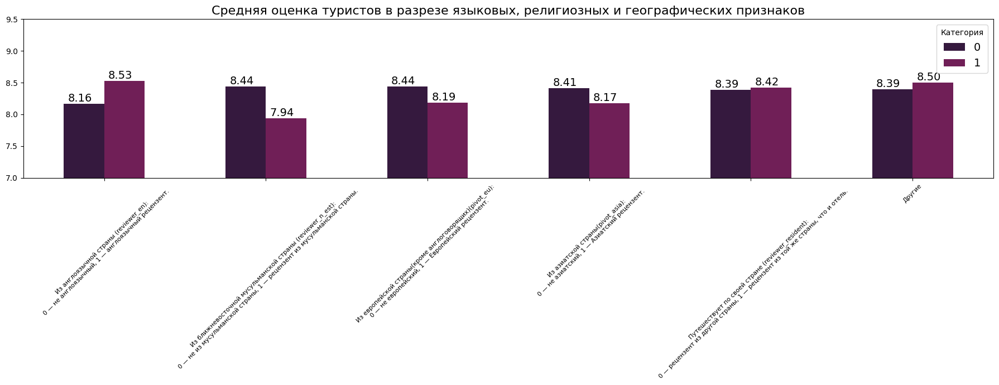

In [287]:
# подготовим данные для диаграммы:
mask = data['sample'] == 1
pivot_en = data[mask].groupby('reviewer_en')['reviewer_score'].mean()
pivot_n_est = data[mask].groupby('reviewer_muslim')['reviewer_score'].mean()
pivot_resident = data[mask].groupby('reviewer_resident')['reviewer_score'].mean()
pivot_eu = data[mask].groupby('reviewer_eu')['reviewer_score'].mean()
pivot_asia = data[mask].groupby('reviewer_asia')['reviewer_score'].mean()
pivot_other = data[mask].groupby('other_country')['reviewer_score'].mean()

# создаём DataFrame с новыми подписями:
pivot = pd.DataFrame({
    'Из англоязычной страны (reviewer_en):\n0 — не англоязычный, 1 — англоязычный рецензент.': pivot_en,
    'Из ближневосточной мусульманской страны (reviewer_n_est):\n0 — не из мусульманской страны, 1 — рецензент из мусульманской страны.': pivot_n_est,
    'Из европейской страны(кроме англоговорящих)(pivot_eu):\n0 — не европейский, 1 — Европейский рецензент.': pivot_eu,
    'Из азиатской страны(pivot_asia):\n0 — не азиатский, 1 — Азиатский рецензент.': pivot_asia,
    'Путешествует по своей стране (reviewer_resident):\n0 — рецензент из другой страны, 1 — рецензент из той же страны, что и отель.': pivot_resident,
    'Другие': pivot_other
}).T

# строим диаграмму:
fig2, ax2 = plt.subplots(figsize=(18, 7))
pivot_barplot = pivot.plot(
    ax=ax2, 
    kind='bar', 
    rot=0)

ax2.set_title(
    'Средняя оценка туристов в разрезе языковых, религиозных и географических признаков', size=16)
ax2.legend(['0', '1'], loc='upper right', fontsize=14, title="Категория")

# Добавим аннотации:
for p in pivot_barplot.patches:
    pivot_barplot.annotate(f'{p.get_height():.2f}', (p.get_x()+0.1, p.get_height()),
    ha='center', va='bottom', fontsize=14)

plt.xticks(fontsize= 8, rotation=45)
plt.ylim(7, 9.5)
plt.tight_layout()
plt.show()




Для каждой пары проверим статистическую значимость:

($H_0$): Распределение оценок в двух группах одинаково. То есть нет статистически значимой разницы между распределениями.

($H_1$): Распределение оценок в двух группах различается. Есть статистически значимая разница между распределениями.

In [288]:
# Создадим лист с проверяемыми признаками
binary_features = [
    'reviewer_en',        # англоязычные или нет
    'reviewer_muslim',    # из мусульманской страны или нет
    'reviewer_eu',        # из ЕС или нет
    'reviewer_asia',      # из Азии или нет
    'reviewer_resident'   # из той же страны, что и отель
]

results = []

# Для каждого признака из списка выделяем группы для теста и сохраняем результат
for feature in binary_features:
    group_0 = data[(data['sample'] == 1) & (data[feature] == 0)]['reviewer_score']
    group_1 = data[(data['sample'] == 1) & (data[feature] == 1)]['reviewer_score']
    
    # Получаем результаты теста Манна-Уитни
    test_result = stat_test('mannwhitneyu', (group_0, group_1), alt='two-sided', verbose=False)
    
    # Получаем коэффициент Кохена для различия между группами
    cohens_result = cohens(group_0, group_1)
    
    result = {
        'Признак': feature,
        'Среднее (0)': round(group_0.mean(), 2),
        'Среднее (1)': round(group_1.mean(), 2),
        'Тест Манна-Уитни': test_result,
        'Коэффициент Кохена': cohens_result
    }
    
    results.append(result)

# Отображаем результаты в виде DataFrame
display(pd.DataFrame(results))


,Признак,Среднее (0),Среднее (1),Тест Манна-Уитни,Коэффициент Кохена
0,reviewer_en,8.16,8.53,Отклоняем H₀,"Cohen's d: 0.2, уровень эффекта: малый"
1,reviewer_muslim,8.44,7.94,Отклоняем H₀,"Cohen's d: 0.3, уровень эффекта: малый"
2,reviewer_eu,8.44,8.19,Отклоняем H₀,"Cohen's d: 0.0, уровень эффекта: незначительный"
3,reviewer_asia,8.41,8.17,Отклоняем H₀,"Cohen's d: 0.0, уровень эффекта: незначительный"
4,reviewer_resident,8.39,8.42,Отклоняем H₀,"Cohen's d: 0.0, уровень эффекта: незначительный"


Вывод:

Для каждого созданного признака имеется стаатистически важная значимость, но в признаках 'reviewer_en' и 'reviewer_muslim' уровень влияния малый, для остальных признаков незначительный. Пока что оставим все признаки, примем решешие об их удалении или оставлении позже.

In [289]:
# Добавляем ненужные признаки в список для удаления
drop_list.extend(['reviewer_nationality', 'reviewer_continent'])

### 3.2.4 Признаки 'negative_review' и 'positive_review'

Создадим полезные признаки, которые можно использловать в обучении.

Проанализируем тональность негативных и позитивных отзывов. Для этого мы используем библиотеку VADER и её инструмент SentimentIntensityAnalyzer, который оценивает тональность текста по четырём параметрам: негативность, нейтральность, позитивность и совокупная оценка.

Также попробуем провести анализ отзывов с помощью библиотеки TextBlob, она позволяет определить:

* Полярность — насколько отзыв положительный или отрицательный (от -1 до 1).

* Субъективность — насколько отзыв субъективен (от 0 до 1).

In [290]:
# Посмотрим, какие данные содержатся в признаке:
list(data['negative_review'][:50])

[' Would have appreciated a shop in the hotel that sold drinking water etc but not necessity Would recommend if like us you arrive late at night to bring drinks from plane airport as there s no shop nearby There is a minibar though if you want to pay those prices ',
 ' No tissue paper box was present at the room',
 ' Pillows ',
 'No Negative',
 'No Negative',
 ' They don t have free wifi',
 ' Room generally a bit shabby with some lack of maintenance Some crumbs on bedroom floor these issues did not spoil our minibreak It would be nice to have vegetarian sausages available for breakfast ',
 ' Executive rooms 9th Floor don t have a bath Their website made it look like all rooms did have one and when being at the end of a hall there s no wifi connection possible Mind that during my first two stays here I did have a perfect wifi connection ',
 ' Pity about the two days of rain',
 ' Didn t like it at all construction was in progress stuff lied to us about vacancy ',
 ' N A',
 'No Negative',

In [291]:
# Преобразим признаки дл ядальнейшей работы: удалим лишнии пробелы и приведем к одному регистру
data['negative_review'] = data['negative_review'].apply(lambda x: x.strip().lower())
data['positive_review'] = data['positive_review'].apply(lambda x: x.strip().lower())

In [292]:
# Посмотрим, что чаще всего встречалось среди негативных отзывов
most_common_neg = data.negative_review.value_counts().reset_index()
most_common_neg[most_common_neg['count'] > 25][:50]

,negative_review,count
0,no negative,127890
1,nothing,21185
2,n a,1815
3,none,1501
4,,849
5,nothing really,656
6,small room,570
7,breakfast,545
8,all good,545
9,no complaints,523


In [293]:
# Посмотрим, что чаще всего встречалось среди позитивных
most_common_pos = data['positive_review'].value_counts().reset_index()
most_common_pos[most_common_pos['count'] > 100][:50]

,positive_review,count
0,no positive,35946
1,location,11945
2,everything,3314
3,nothing,1731
4,great location,1687
5,the location,1606
6,good location,1496
7,breakfast,795
8,friendly staff,733
9,excellent location,639


In [294]:
# Создаём два анализатора: один для негативных отзывов, другой — для позитивных
sia_pos = SentimentIntensityAnalyzer()
sia_neg = SentimentIntensityAnalyzer()

# Обновляем лексикон для позитивных и негативных фраз
positive_phrases = [
    'no negative', 'nothing', 'nothing to dislike', 'absolutely nothing', 'no complaints', 'none', 
    'nothing really', 'all good', 'everything was great', 'nothing to complain about', 'i liked everything', 
    'nothing all good', 'everything was good', 'liked everything', 'nothing it was perfect', 
    'nothing everything was great', 'all was good', 'we liked everything', 'nothing i didn t like', 
    'no negatives', 'it was all good', 'loved everything', 'there was nothing to dislike', 'all ok', 
    'no dislikes', 'everything was excellent', 'no problems', 'everything was ok'
]

negative_phrases = ['no positive', 'nothing', 'none', 'all was bad']

# Обновляем лексикон для позитивных и негативных фраз
positive_lexicon = {phrase: 10 for phrase in positive_phrases}  # Присваиваем положительные значения
negative_lexicon = {phrase: -10 for phrase in negative_phrases}  # Присваиваем сильные отрицательные значения

sia_pos.lexicon.update(positive_lexicon)
sia_neg.lexicon.update(negative_lexicon)

# Применяем замену фраз из списков positive_phrases и negative_phrases на соответствующие метки
for phrase in positive_phrases:
    data['negative_review_temp'] = data['negative_review'].apply(lambda x: x.replace(phrase, 'Positive'))
    data['positive_review_temp'] = data['positive_review'].apply(lambda x: x.replace(phrase, 'Negative'))

for phrase in negative_phrases:
    data['positive_review_temp'] = data['positive_review'].apply(lambda x: x.replace(phrase, 'Negative'))
    data['negative_review_temp'] = data['negative_review'].apply(lambda x: x.replace(phrase, 'Positive'))

# Применяем анализ настроений к каждому отзыву
data['negative_review_sentiments'] = data['negative_review_temp'].apply(
    lambda x: sia_neg.polarity_scores(x))
data['positive_review_sentiments'] = data['positive_review_temp'].apply(
    lambda x: sia_pos.polarity_scores(x))

# Создаём новые признаки для анализа настроений
data['n_review_sentiments_neg'] = data['negative_review_sentiments'].apply(
    lambda x: x['neg'])
data['n_review_sentiments_neu'] = data['negative_review_sentiments'].apply(
    lambda x: x['neu'])
data['n_review_sentiments_pos'] = data['negative_review_sentiments'].apply(
    lambda x: x['pos'])
data['n_review_sentiments_compound'] = data['negative_review_sentiments'].apply(
    lambda x: x['compound'])

data['p_review_sentiments_neg'] = data['positive_review_sentiments'].apply(
    lambda x: x['neg'])
data['p_review_sentiments_neu'] = data['positive_review_sentiments'].apply(
    lambda x: x['neu'])
data['p_review_sentiments_pos'] = data['positive_review_sentiments'].apply(
    lambda x: x['pos'])
data['p_review_sentiments_compound'] = data['positive_review_sentiments'].apply(
    lambda x: x['compound'])

# Выводим первые строки для проверки
data.head()


,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,...,negative_review_sentiments,positive_review_sentiments,n_review_sentiments_neg,n_review_sentiments_neu,n_review_sentiments_pos,n_review_sentiments_compound,p_review_sentiments_neg,p_review_sentiments_neu,p_review_sentiments_pos,p_review_sentiments_compound
0,Via Senigallia 6 20161 Milan Italy,904,2017-07-21,8.1,Hotel Da Vinci,United Kingdom,would have appreciated a shop in the hotel tha...,52,16670,hotel was great clean friendly staff free brea...,...,"{'neg': 0.129, 'neu': 0.747, 'pos': 0.125, 'co...","{'neg': 0.0, 'neu': 0.671, 'pos': 0.329, 'comp...",0.129,0.747,0.125,-0.0554,0.000,0.671,0.329,0.9615
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,2016-12-12,8.6,Urban Lodge Hotel,Belgium,no tissue paper box was present at the room,10,5018,no positive,...,"{'neg': 0.216, 'neu': 0.784, 'pos': 0.0, 'comp...","{'neg': 0.379, 'neu': 0.0, 'pos': 0.621, 'comp...",0.216,0.784,0.000,-0.2960,0.379,0.000,0.621,0.3400
2,Mallorca 251 Eixample 08008 Barcelona Spain,46,2015-11-26,8.3,Alexandra Barcelona A DoubleTree by Hilton,Sweden,pillows,3,351,nice welcoming and service,...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...","{'neg': 0.0, 'neu': 0.26, 'pos': 0.74, 'compou...",0.000,1.000,0.000,0.0000,0.000,0.260,0.740,0.6908
3,Piazza Della Repubblica 17 Central Station 201...,241,2015-10-17,9.1,Hotel Principe Di Savoia,United States of America,no negative,0,1543,everything including the nice upgrade the hote...,...,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...","{'neg': 0.0, 'neu': 0.621, 'pos': 0.379, 'comp...",1.000,0.000,0.000,-0.7096,0.000,0.621,0.379,0.9153
4,Singel 303 309 Amsterdam City Center 1012 WJ A...,834,2016-05-16,9.1,Hotel Esther a,United Kingdom,no negative,0,4687,lovely hotel v welcoming staff,...,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...","{'neg': 0.0, 'neu': 0.23, 'pos': 0.77, 'compou...",1.000,0.000,0.000,-0.7096,0.000,0.230,0.770,0.7717


In [295]:
# Создадим признак, который  показывает преобладает в отзыве позитив или негатив
data['overall_sentiment'] = (
    data['p_review_sentiments_compound'] - data['n_review_sentiments_compound']
)


Что показывают эти признаки?

1. Абсолютные значения (начинаются с n_)
Эти признаки отображают общее количество слов или фрагментов текста определённой тональности в отзыве.

* n_review_sentiments_neg — количество негативных слов/фраз в отзыве.
→ Чем выше, тем более негативным является текст.

* n_review_sentiments_neu — количество нейтральных слов.
→ Показывает, сколько текста не выражает ярко выраженных эмоций.

* n_review_sentiments_pos — количество позитивных слов.
→ Чем выше, тем отзыв позитивнее.

* n_review_sentiments_compound — суммарная оценка тональности по всему тексту отзыва.
  → Это итоговый показатель:

  От -1 (полностью негативный)

  До +1 (полностью позитивный)

2. Пропорциональные значения (начинаются с p_)
Эти признаки показывают долю тональности в тексте отзыва (в процентах или от 0 до 1). Это нормализованные значения.

* p_review_sentiments_neg — доля негативной тональности.
→ Например, 0.2 — значит 20% текста имеет негативную окраску.

* p_review_sentiments_neu — доля нейтрального текста.
→ Показывает, насколько отзыв "сухой", фактологичный.

* p_review_sentiments_pos — доля позитивной тональности.
→ Чем выше, тем отзыв более положительный.

* p_review_sentiments_compound — пропорциональное значение суммарной тональности.
→ Похоже на абсолютный compound, но нормировано.

3. overall_sentiment

Общая оценка тональности — это сводная оценка, показывающая, насколько отзыв "в целом" положителен или отрицателен.

__Попробуем проанализировать отзывы с помощью TextBlob__

TextBlob — это простая и удобная библиотека для базового анализа текста. Она позволяет определить:

Полярность — насколько отзыв положительный или отрицательный (от -1 до 1).

Субъективность — насколько отзыв субъективен (от 0 до 1).

In [296]:
# Применим TextBlob к каждому отзыву
data['positive_polarity'] = data['positive_review'].apply(lambda x: TextBlob(x).sentiment.polarity)
data['positive_subjectivity'] = data['positive_review'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

data['negative_polarity'] = data['negative_review'].apply(lambda x: TextBlob(x).sentiment.polarity)
data['negative_subjectivity'] = data['negative_review'].apply(lambda x: TextBlob(x).sentiment.subjectivity)


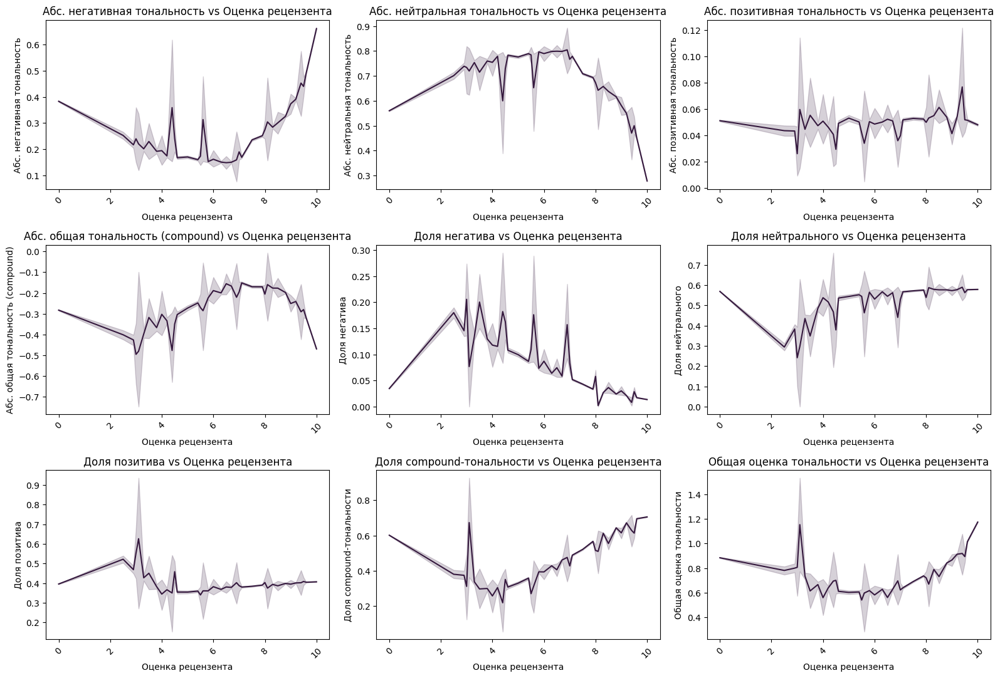

In [297]:
# Список признаков для визуализации
cols_to_plot = [
    'n_review_sentiments_neg', 'n_review_sentiments_neu',
    'n_review_sentiments_pos', 'n_review_sentiments_compound',
    'p_review_sentiments_neg', 'p_review_sentiments_neu',
    'p_review_sentiments_pos', 'p_review_sentiments_compound',
    'overall_sentiment'
]

# Русские названия признаков для отображения на графиках
col_titles = {
    'n_review_sentiments_neg': 'Абс. негативная тональность',
    'n_review_sentiments_neu': 'Абс. нейтральная тональность',
    'n_review_sentiments_pos': 'Абс. позитивная тональность',
    'n_review_sentiments_compound': 'Абс. общая тональность (compound)',
    'p_review_sentiments_neg': 'Доля негатива',
    'p_review_sentiments_neu': 'Доля нейтрального',
    'p_review_sentiments_pos': 'Доля позитива',
    'p_review_sentiments_compound': 'Доля compound-тональности',
    'overall_sentiment': 'Общая оценка тональности'
}

# Создаем подграфики для каждого признака
plt.figure(figsize=(16, 14))
for i, col in enumerate(cols_to_plot, 1):
    plt.subplot(4, 3, i)
    sns.lineplot(x='reviewer_score', y=col, data=data)
    plt.title(f'{col_titles[col]} vs Оценка рецензента')
    plt.xticks(rotation=45)
    plt.xlabel('Оценка рецензента')
    plt.ylabel(col_titles[col])

plt.tight_layout()
plt.show()

In [298]:
# добавим в список удаления
drop_list.extend(['negative_review', 'positive_review', 'negative_review_temp', 'positive_review_temp', 'negative_review_sentiments', 'positive_review_sentiments'])

### 3.2.5 Признак 'tags'

In [299]:
# Посмотрим, какие данные хранятся в признаке:
list(data['tags'][60:90])


["[' Leisure trip ', ' Couple ', ' Superior Double Room ', ' Stayed 2 nights ']",
 "[' Business trip ', ' Solo traveler ', ' Classic Double Room ', ' Stayed 4 nights ']",
 "[' Leisure trip ', ' Couple ', ' Junior Suite ', ' Stayed 5 nights ', ' Submitted from a mobile device ']",
 "[' Leisure trip ', ' Couple ', ' Double or Twin Room with View ', ' Stayed 3 nights ', ' Submitted from a mobile device ']",
 "[' Leisure trip ', ' Family with young children ', ' Classic Double Room ', ' Stayed 5 nights ', ' Submitted from a mobile device ']",
 "[' Leisure trip ', ' Couple ', ' Deluxe Double or Twin Room with City View ', ' Stayed 1 night ']",
 "[' Leisure trip ', ' Family with young children ', ' Superior Twin Room ', ' Stayed 4 nights ']",
 "[' Leisure trip ', ' Couple ', ' Deluxe Double ', ' Stayed 2 nights ']",
 "[' Leisure trip ', ' Group ', ' Superior King Room ', ' Stayed 2 nights ', ' Submitted from a mobile device ']",
 "[' Leisure trip ', ' Family with older children ', ' Superior

Каждая строка в признаке `tags` содержит несколько тегов, которые описывают различные аспекты поездки. На основе этих тегов мы будем извлекать следующие категории информации:

1. **Тип поездки** (`type_trip`):
    - Мы проверяем, является ли поездка деловой или досуговой.
    - Пример: `Leisure trip` или `Business trip`.

2. **Использование мобильного устройства** (`from_mobile`):
    - Мы проверяем наличие тега `Submitted from a mobile device`. Если он присутствует, присваиваем значение 1 (иначе 0).

3. **Наличие питомца** (`with_pet`):
    - Если в тегах есть `With a pet`, присваиваем значение 1 (если нет — 0).
    - Пример: 1, если путешественник был с питомцем, иначе 0.

4. **Тип путешественника** (`traveler_type`):
    - Мы ищем один из известных типов путешественников: `Solo traveler`, `Couple`, `Family with young children`, `Family with older children`, `Group`.

5. **Количество ночей** (`nights_count`):
    - Мы извлекаем количество ночей из тега в формате "Stayed X nights". Если количество ночей не указано, по умолчанию присваиваем 1.

6. **Тип номера** (`room_type`):
    - Все теги, не попавшие в предыдущие категории, рассматриваются как возможный тип номера.
    - Пример: `double room`, `queen room`, `suite`.

Процесс извлечения признаков:

1. Сначала очищаем строку от лишних символов и разбиваем на список тегов.
2. Затем проходим по каждому тегу и извлекаем значения, соответствующие определённым категориям.
3. После извлечения значений, сохраняем их в соответствующие новые столбцы в DataFrame.

In [300]:
def get_tags(tags_string):
    """Выделение 6 типов тегов по шаблонам."""
    tags_string = tags_string.replace('[', '').replace(']', '')
    tags_string = tags_string.replace("' ", '').replace(" '", '')
    tags_list = tags_string.split(',')
    tags_list = list(map(lambda x: x.strip(), tags_list))

    # Инициализация переменных для каждого тега
    tag_from_mobile = 0  # По умолчанию отзыв не был отправлен с мобильного устройства
    tag_with_pet = 0  # По умолчанию нет питомца
    tag_leisure_trip = 'Leisure trip'  # По умолчанию считаем, что поездка не является командировкой
    tag_reviewer_type = 'Other'  # По умолчанию не определен тип путешественника
    tag_count_nights = 1  # По умолчанию количество ночей равно 1
    tag_room_type = 'Other'  # По умолчанию тип номера не указан
    
    # распределяем теги
    for teg in list(tags_list):
        if teg == 'Submitted from a mobile device':
            tag_from_mobile = 1
            tags_list.remove(teg)

        if teg == 'With a pet':
            tag_with_pet = 1
            tags_list.remove(teg)

        if teg == 'Business trip':
            tag_leisure_trip = 'Business trip'  # Изменяем на бизнес-поездку
            tags_list.remove(teg)

        if teg == 'Leisure trip':
            tags_list.remove(teg)

        if teg in ['Solo traveler', 'Couple', 'Travelers with friends', 'Family with young children', 'Family with older children', 'Group']:
            tag_reviewer_type = teg  # Присваиваем тип путешественника
            tags_list.remove(teg)

        if re.fullmatch(r'Stayed\s\d+\snight\w?', teg): # ищем подходящий тег через регулярное выражение
            tag_count_nights = [int(s) for s in re.findall(r'-?\d+\.?\d*', teg)][0]           
            tags_list.remove(teg)

        # Тип номера (если остается)
        if len(tags_list) > 0:
            tag_room_type = tags_list[0]

    return tag_leisure_trip, tag_from_mobile, tag_with_pet, tag_reviewer_type, tag_count_nights, tag_room_type

# Применяем функцию к данным
data[['type_trip', 'from_mobile', 'with_pet', 'traveler_type', 'nights_count', 'room_type']] = pd.DataFrame(data['tags'].apply(get_tags).to_list(), index=data.index)



In [301]:
data[['type_trip', 'from_mobile', 'with_pet', 'traveler_type', 'nights_count', 'room_type']]

,type_trip,from_mobile,with_pet,traveler_type,nights_count,room_type
0,Leisure trip,0,0,Couple,2,Double Room
1,Leisure trip,0,0,Group,1,Triple Room
2,Business trip,1,0,Solo traveler,1,Twin Room
3,Leisure trip,0,0,Couple,1,Ambassador Junior Suite
4,Business trip,1,0,Solo traveler,2,Classic Double or Twin Room
...,...,...,...,...,...,...
515733,Leisure trip,1,0,Group,2,Club Double or Twin Room
515734,Leisure trip,1,0,Couple,4,Standard Double Room
515735,Business trip,0,0,Solo traveler,1,Single Room
515736,Leisure trip,0,0,Solo traveler,2,Deluxe Double Room


In [302]:
data['room_type'].nunique()

2394

В признаке room_type слишком много уникальных значений(2394), невожможно закодировать такой признак, попробуем это исправить.

In [303]:
# Признак: наличие вида из окна
data['tag_view_room'] = data['room_type'].apply(
    lambda x: 1 if ('View' in x) or ('Panoramic' in x) else 0
)

# Создадим новый признак категории номеров и распределим имеющиеся типы по 8 категориям: luxury, standard, deluxe, apartment, suite, economy, family и other
# Функция классификации типа номера по ключевым словам
def categorize_room_type(room_type):
    category_keywords = {
        'Luxury': ['luxury', 'premium', 'executive', 'royal', 'penthouse', 'four poster', 'club', 'business', 'privilege'],
        'Deluxe': ['deluxe', 'superior', 'king', 'queen', 'comfort', '3 rooms', 'penta', 'wonderful', 'view', 'panoram', 'terrace', 'premier', 'garden'],
        'Standard': ['standard', 'double', 'twin', 'single', 'triple', 'two connecting','quadruple', 'classic', 'one bed','large room', '2 rooms', 'bunk', 'couple', 'cosy'],
        'Apartment': ['apartment', 'studio', 'maisonette', 'loft', 'townhouse'],
        'Suite': ['suite', 'junior suite', 'presidential suite', 'executive suite', 'duplex'],
        'Economy': ['bunk bed', 'dormitory', 'budget', 'economy', 'hostel', 'mini'],
        'Family': ['family', 'quintuple', '6 persons', '4 rooms', 'group']
    }

    room_type_lower = room_type.lower()
    for category, keywords in category_keywords.items():
        if any(keyword in room_type_lower for keyword in keywords):
            return category
    return 'Other'

# Применяем функцию к признаку tag_room_type
data['room_type_category'] = data['room_type'].apply(categorize_room_type)

data[['room_type_category', 'room_type']]


,room_type_category,room_type
0,Standard,Double Room
1,Standard,Triple Room
2,Standard,Twin Room
3,Suite,Ambassador Junior Suite
4,Standard,Classic Double or Twin Room
...,...,...
515733,Luxury,Club Double or Twin Room
515734,Standard,Standard Double Room
515735,Standard,Single Room
515736,Deluxe,Deluxe Double Room


In [304]:
data['room_type_category'].value_counts()

room_type_category
Standard     253188
Deluxe       207362
Luxury        35979
Suite         10217
Family         4373
Apartment      2790
Other          1722
Economy         107
Name: count, dtype: int64

In [305]:
# Добавим ненужные признаки в список для удаления
drop_list.extend(['room_type', 'tags', 'from_mobile']) #'from_mobile' тоже удалим, он не несет полезной информации

У нас получилось 8 категорий номеров, с которыми в дальнейшем можно работать

****
Теперь проведем статистические тесты и проверим статистическую значимость созданных признаков
****

Из признака 'tags' создали 'type_trip', 'with_pet', 'traveler_type', 'nights_count', 'room_type_category'

Посмотрим на их влияние на оценку отеля

`type_trip:`

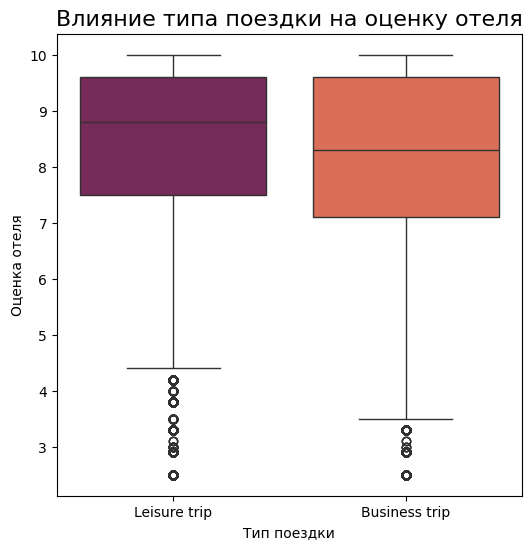

In [306]:
filtered_data = data[data['sample'] == 1]
plt.figure(figsize=(6, 6))

# Boxplot для оценки отеля в зависимости от типа поездки
sns.boxplot(data=filtered_data, x='type_trip', y='reviewer_score', hue='type_trip', palette='rocket', legend=False)

# Настройки графика
plt.title('Влияние типа поездки на оценку отеля', fontsize=16)
plt.xlabel('Тип поездки')
plt.ylabel('Оценка отеля')
plt.show()

Из графика видно, что средняя оценка отелей в бизнес поездках ниже, чем в поездках не рабочих

Проверим является ли это предположение статистически значимым.

*Нулевая гипотеза* ($H_0$): Оценки в бизнес поездках выше или равны оценкам туристическим.

*Альтернативная гипотеза* ($H_1$): Оценки туристов выше оценок в бизнес поездках.


In [307]:
# Оценки для туристов (Leisure trip) и для бизнес-поездок (Business trip)
leisure_trip_ratings = filtered_data[filtered_data['type_trip'] == 'Leisure trip']['reviewer_score']
business_trip_ratings = filtered_data[filtered_data['type_trip'] == 'Business trip']['reviewer_score']

# Тест Шапиро
shapiro(leisure_trip_ratings, 1)
shapiro(business_trip_ratings, 2)

# Используем тест Манна-Уитни
test_result = stat_test('mannwhitneyu', (leisure_trip_ratings, business_trip_ratings), alt='greater')

# проверяем значимость тестом Кохана
cohens_result = cohens(leisure_trip_ratings, business_trip_ratings)
cohens_result

Группа 1: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 2: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 324814.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 61989.
  res = hypotest_fun_out(*samples, **kwds)


"Cohen's d: 0.3, уровень эффекта: малый"

Вывод:

Оценки туристов выше оценок в бизнес поездках

`with_pet:`

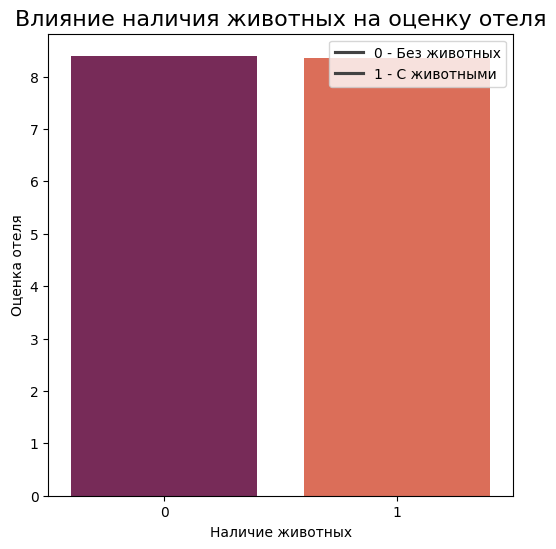

In [308]:
with_pets = filtered_data.groupby('with_pet')['reviewer_score'].mean().reset_index()

plt.figure(figsize=(6, 6))

# Boxplot для оценки отеля в зависимости от типа поездки
sns.barplot(data=with_pets, x='with_pet', y='reviewer_score', hue='with_pet', palette='rocket')

# Настройки графика
plt.legend(['0 - Без животных', '1 - С животными'], loc='upper right')
plt.title('Влияние наличия животных на оценку отеля', fontsize=16)
plt.xlabel('Наличие животных')
plt.ylabel('Оценка отеля')
plt.show()

Из графика видно, что этот признак не влияет на оценку отеля, можно удалить

In [309]:
drop_list.append('with_pet')

`traveler_type:`

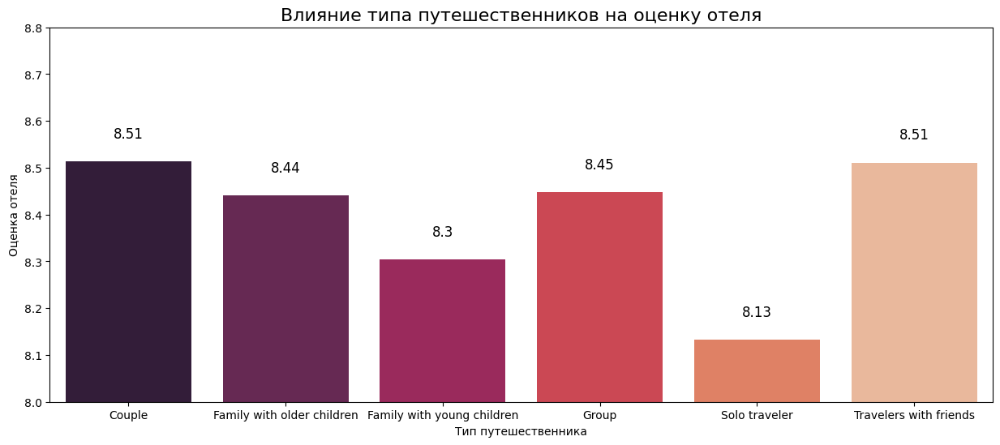

In [310]:
traveler = filtered_data.groupby('traveler_type')['reviewer_score'].mean().reset_index()

plt.figure(figsize=(15, 6))

# Boxplot для оценки отеля в зависимости от типа поездки
ax = sns.barplot(data=traveler, x='traveler_type', y='reviewer_score', hue='traveler_type', palette='rocket')

# Добавление аннотаций
for i in range(len(traveler)):
    ax.text(i, traveler['reviewer_score'][i] + 0.05, round(traveler['reviewer_score'][i], 2), 
            ha='center', fontsize=12)
    
# Настройки графика
plt.title('Влияние типа путешественников на оценку отеля', fontsize=16)
plt.xlabel('Тип путешественника')
plt.ylabel('Оценка отеля')
plt.ylim(8, 8.8)
plt.show()

Из графика можно сделать вывод, что тип путешественников влияет на оценку отеля

Проверим является ли это предположение статистически значимым.

*Нулевая гипотеза* ($H_0$): Тип путешественника не влияет на оценку отеля, т.е оценки равны.

*Альтернативная гипотеза* ($H_1$): Тип путешественника влияет на оценку отеля, т.е оценки статистически отличаются.


In [311]:
groups = [filtered_data.loc[filtered_data['traveler_type'] == type, 'reviewer_score'] for type in filtered_data['traveler_type'].unique()]

# Тест Шапиро
for i, group in enumerate(groups, 1):
    shapiro(group, i)

Группа 1: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 2: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 3: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 4: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 5: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 6: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.


c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 189212.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 81235.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 45836.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 49088.
  res 

In [312]:
# данные распределены не нормально, больше 3х независимых групп - выбираем тест Краскела-Уоллиса
result = stat_test('kruskal', groups)

p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


Вывод:

Тип путешественника влияет на оценку отеля

`'nights_count'`:

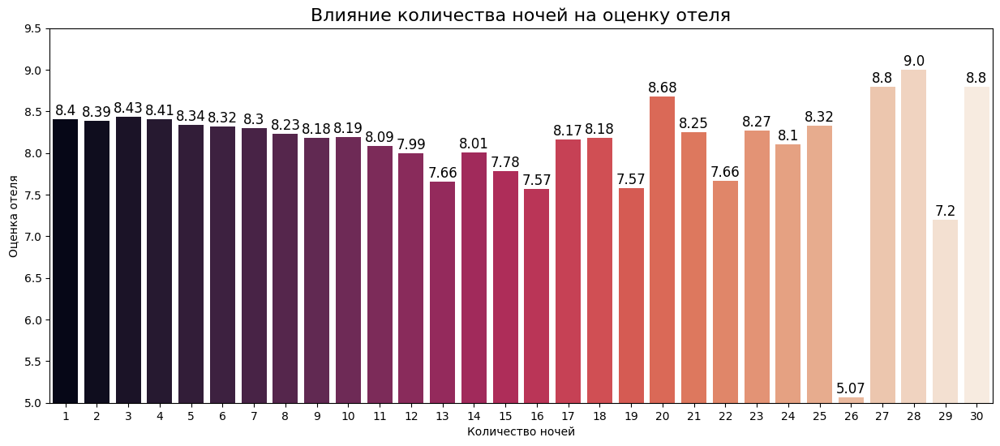

In [313]:
night_cnt = filtered_data.groupby('nights_count')['reviewer_score'].mean().reset_index()

plt.figure(figsize=(15, 6))

# Boxplot для оценки отеля в зависимости от количества ночей
ax = sns.barplot(data=night_cnt, x='nights_count', y='reviewer_score', hue='nights_count', palette='rocket', legend=False)

# Добавление аннотаций
for i in range(len(night_cnt)):
    ax.text(i, night_cnt['reviewer_score'][i] + 0.05, round(night_cnt['reviewer_score'][i], 2), 
            ha='center', fontsize=12)
    
# Настройки графика
plt.title('Влияние количества ночей на оценку отеля', fontsize=16)
plt.xlabel('Количество ночей')
plt.ylabel('Оценка отеля')
plt.ylim(5, 9.5)
plt.show()

Из графика наблюдаем, что средняя оценка отеля очень отличается в зависимости от количества проведенных в отеле ночей, проверим тестом:

*Нулевая гипотеза* ($H_0$): Количество ночей пребывания не влияет на оценку отеля, т.е оценки равны.

*Альтернативная гипотеза* ($H_1$): Количество ночей пребывания влияет на оценку отеля, т.е оценки статистически отличаются.

In [314]:
groups = [filtered_data.loc[filtered_data['nights_count'] == cnt, 'reviewer_score'] for cnt in filtered_data['nights_count'].unique()]

# данные распределены не нормально, больше 3х независимых групп - выбираем тест Краскела-Уоллиса
result = stat_test('kruskal', groups)



p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


Вывод:

Количество ночей пребывания влияет на оценку отеля


`'room_type_category'`:

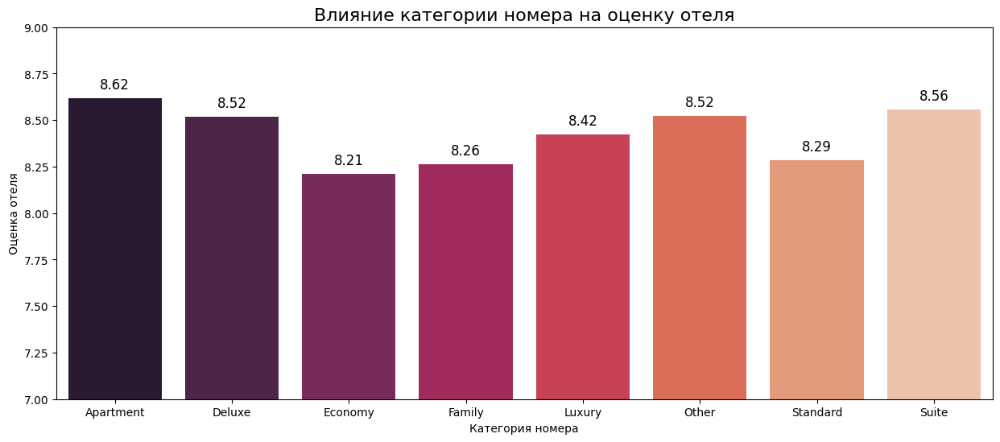

In [315]:
room_type = filtered_data.groupby('room_type_category')['reviewer_score'].mean().reset_index()

plt.figure(figsize=(15, 6))

# Boxplot для оценки отеля в зависимости от категории номера
ax = sns.barplot(data=room_type, x='room_type_category', y='reviewer_score', hue='room_type_category', palette='rocket', legend=False)

# Добавление аннотаций
for i in range(len(room_type)):
    ax.text(i, room_type['reviewer_score'][i] + 0.05, round(room_type['reviewer_score'][i], 2), 
            ha='center', fontsize=12)
    
# Настройки графика
plt.title('Влияние категории номера на оценку отеля', fontsize=16)
plt.xlabel('Категория номера')
plt.ylabel('Оценка отеля')
plt.ylim(7, 9)
plt.show()

Из графика можно сделать вывод, что категория номера влияет на оценку отеля

Проверим является ли это предположение статистически значимым.

*Нулевая гипотеза* ($H_0$): Категория номера не влияет на оценку отеля, т.е оценки равны.

*Альтернативная гипотеза* ($H_1$): Категория номера влияет на оценку отеля, т.е оценки статистически отличаются.

In [316]:
groups = [filtered_data.loc[filtered_data['room_type_category'] == type, 'reviewer_score'] for type in filtered_data['room_type_category'].unique()]

# Тест Шапиро
for i, group in enumerate(groups, 1):
    shapiro(group, i)
 

Группа 1: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 2: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 3: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 4: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 5: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 6: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 7: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 8: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.


c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 189876.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 155544.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 26962.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 7595.
  res 

In [317]:
# данные распределены не нормально, больше 3х независимых групп - выбираем тест Краскела-Уоллиса
result = stat_test('kruskal', groups)

p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


Вывод:

Категория номера влияет на оценку отеля

### 3.2.6 Признак 'days_since_review '

Признак представляет собой строку с количеством дней и словом, просто удалим слово и приведем к int

In [318]:
data['days_since_review']

0         13 days
1         234 day
2         616 day
3         656 day
4         444 day
           ...   
515733    106 day
515734    171 day
515735    543 day
515736    74 days
515737    363 day
Name: days_since_review, Length: 515738, dtype: object

In [319]:
data['days_since_review'] = data['days_since_review'].apply(lambda x: int(x.split(' ')[0]))
data['days_since_review']

0          13
1         234
2         616
3         656
4         444
         ... 
515733    106
515734    171
515735    543
515736     74
515737    363
Name: days_since_review, Length: 515738, dtype: int64

## 3.3 Обработка числовых признаков

В датасете имеется 9 числовых признаков: 'additional_number_of_scoring', 'average_score', 'review_total_negative_word_counts', 'total_number_of_reviews', 'review_total_positive_word_counts', 'total_number_of_reviews_reviewer_has_given', 'lat', 'lng', 'reviewer_score'
Все признаки кроме 'lat' и 'lng' выглядят самодостаточными, поэтому 


### 3.3.1 Обработка признаков 'lag' и 'lng' 

Сами по себе координаты не дают полезной информации, но мы можем с их помощью посчитать расстояние от отеля до центра города

In [320]:
# Создаем словарь с координатами центра города с сайта https://time-in.ru/coordinates

city_centers = {
    'Milan': {'lat': 45.4642, 'lng': 9.1900},       # Piazza del Duomo
    'Amsterdam': {'lat': 52.3731, 'lng': 4.8922},     # Dam Square
    'Barcelona': {'lat': 41.3870, 'lng': 2.1701},     # Plaça de Catalunya
    'London': {'lat': 51.5074, 'lng': -0.1278},       # Центральная точка Лондона (например, Charing Cross)
    'Paris': {'lat': 48.8566, 'lng': 2.3522},         # Центр Парижа (условно, центр города)
    'Vienna': {'lat': 48.2082, 'lng': 16.3738}        # Innere Stadt, центр Вены (Stephansplatz)
}

Создаем функцию для рассчета расстояния с помощью формулы Хаверсина (Haversine)

In [321]:
def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Возвращает расстояние в километрах между двумя координатами.
    """
    R = 6371  # радиус Земли в километрах
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    d_phi = np.radians(lat2 - lat1)
    d_lambda = np.radians(lon2 - lon1)

    a = np.sin(d_phi / 2)**2 + np.cos(phi1) * np.cos(phi2) * np.sin(d_lambda / 2)**2
    c = 2 * np.arcsin(np.sqrt(a))

    return R * c

In [322]:
# Теперь рассчитаем расстояние от отеля до центра соответствующего города:

def compute_distance_to_center(row):
    city = row['hotel_city']
    center = city_centers.get(city)
    if center:
        return haversine_distance(row['lat'], row['lng'], center['lat'], center['lng'])
    return np.nan

# Добавим признак в датафрейм
data['distance_to_center_km'] = data.apply(compute_distance_to_center, axis=1)

In [323]:
# Проверим созданный признак 
data['distance_to_center_km']

0         7.805692
1         4.161301
2         0.993143
3         1.812239
4         0.372849
            ...   
515733    4.623690
515734    2.590191
515735    1.506643
515736    2.392400
515737    4.602908
Name: distance_to_center_km, Length: 515738, dtype: float64

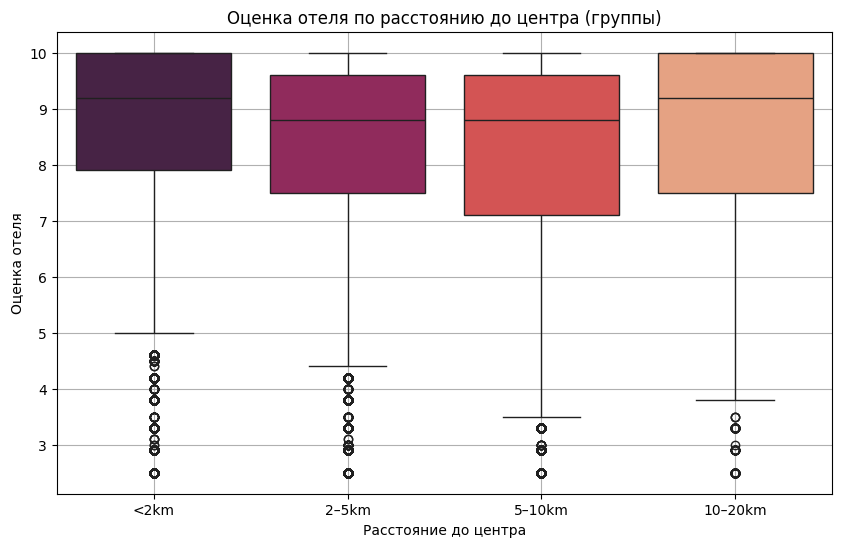

In [324]:
# Группируем расстояние по интервалам чтобы визуализировать зависимость оценки отеля от расстояния до центра города
data['distance_bin'] = pd.cut(data['distance_to_center_km'], bins=[0, 2, 5, 10, 20], 
                              labels=['<2km', '2–5km', '5–10km', '10–20km'])

plt.figure(figsize=(10,6))
sns.boxplot(data=data[data['sample'] == 1], 
            x='distance_bin', 
            y='reviewer_score',
            hue='distance_bin',
            palette='rocket'
            )
plt.title('Оценка отеля по расстоянию до центра (группы)')
plt.xlabel('Расстояние до центра')
plt.ylabel('Оценка отеля')
plt.grid(True)
plt.show()

Проверим является ли это предположение статистически важным.

*Нулевая гипотеза* ($H_0$): Расстояние от центра города до отеля не влияет на оценку.

*Альтернативная гипотеза* ($H_1$): Растояние от центра города до отеля статистически влияет на оценку отеля.

In [325]:
# 'reviewer_score' распределение не нормальное, более 3х независимых групп - выбираем тест Краскала- Уоллиса:
# Создаем список оценок для каждой группы расстояний
filtered_data = data[data['sample'] == 1]
distance_groups = [filtered_data[filtered_data['distance_bin'] == group]['reviewer_score'] for group in filtered_data['distance_bin'].unique()]

# Тест Шапиро
for i, group in enumerate(distance_groups, 1):
    shapiro(group, i)



Группа 1: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 2: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 3: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.
Группа 4: 
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального.


c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 157164.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 172856.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 44272.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 12511.
  res

In [326]:
# Применяем тест Краскала-Уоллиса
result = stat_test('kruskal', distance_groups)

p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Отвергаем нулевую гипотезу в пользу альтернативной.


Вывод:

Существует статистически значимая взаимосвязь между оценкой отеля и его дальностью нахождения оот центра

In [327]:
# Добавим в список для дальнейшего удаления
drop_list.extend(['lat', 'lng'])

# 4. Анализ, преобразование и отбор признаков

### 4.1 Подготовка и анализ мультиколлинеарности

In [328]:
# Удаляем ненужные признаки

data.drop(columns=drop_list, inplace=True)

In [329]:
object_columns = data.select_dtypes(include='object').columns
print(f'Признаков типа object: {len(object_columns)}')
print(object_columns)

Признаков типа object: 5
Index(['hotel_country', 'hotel_city', 'type_trip', 'traveler_type',
       'room_type_category'],
      dtype='object')


In [330]:
# Прямое one-hot-кодирование для категориальных признаков с <=10 уникальными значениями
for col in object_columns:
    dummies = pd.get_dummies(data[col], prefix=col)
    data = pd.concat([data, dummies], axis=1)
    data.drop(columns=[col], inplace=True)

In [331]:
# Кодирование категориального признака 'distance_bin'
encoder = LabelEncoder()
data['distance_bin'] = encoder.fit_transform(data['distance_bin'])

In [332]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 72 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   additional_number_of_scoring                515738 non-null  int64  
 1   average_score                               515738 non-null  float64
 2   review_total_negative_word_counts           515738 non-null  int64  
 3   total_number_of_reviews                     515738 non-null  int64  
 4   review_total_positive_word_counts           515738 non-null  int64  
 5   total_number_of_reviews_reviewer_has_given  515738 non-null  int64  
 6   days_since_review                           515738 non-null  int64  
 7   sample                                      515738 non-null  int64  
 8   reviewer_score                              515738 non-null  float64
 9   month_review                                515738 non-null  int32  
 

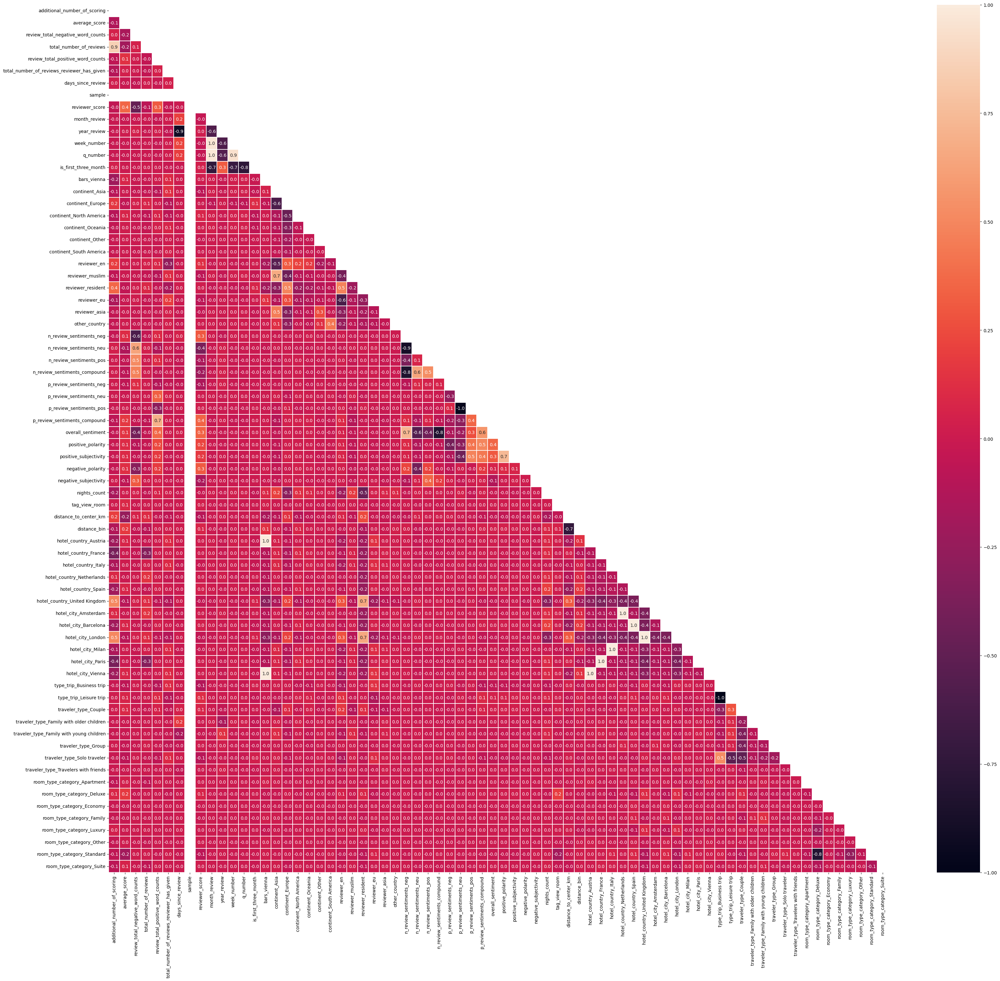

In [333]:
fig_, ax_ = plt.subplots(figsize=(39, 35))
corr = data[data['sample']==1].corr(method="spearman")
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, 
            annot=True, 
            linewidths=0.1, 
            ax=ax_, 
            mask=mask, 
            cmap='rocket',
            fmt='.1f')
plt.show()

In [334]:
# Берем только верхний треугольник матрицы, чтобы избежать дубликатов
upper_tri = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
# Находим пары с высокой корреляцией (по модулю)
high_corr = upper_tri.stack().reset_index()
high_corr.columns = ['Feature 1', 'Feature 2', 'Correlation']
high_corr = high_corr[high_corr['Correlation'].abs() >= 0.7].sort_values(by='Correlation', ascending=False)

display(high_corr)

,Feature 1,Feature 2,Correlation
861,bars_vienna,hotel_country_Austria,1.000000
2142,hotel_country_France,hotel_city_Paris,1.000000
2117,hotel_country_Austria,hotel_city_Vienna,1.000000
2187,hotel_country_Netherlands,hotel_city_Amsterdam,1.000000
2211,hotel_country_Spain,hotel_city_Barcelona,1.000000
2234,hotel_country_United Kingdom,hotel_city_London,1.000000
2166,hotel_country_Italy,hotel_city_Milan,1.000000
872,bars_vienna,hotel_city_Vienna,1.000000
534,month_review,q_number,0.971221
533,month_review,week_number,0.963704


Наблюдается высокая корреляция в признаках:

* даты: days_since_review, q_number и month_review удалим, is_first_three_month сильно коррелирует и изначальными признаками, тоже удалим

* местонахождения отеля: страна и город отеля по сути дублируют друг друга, удалим страну, оставим только город; также удалим признак bars_vienna, он сильно коррелирует с признаками из которых создан

* distance_bin удалим;

* анализ настроения отзыва: удалим n_review_sentiments_compound, p_review_sentiments_pos

* type_trip_Business trip дублирует данные type_trip_Leisure trip, оставим только один

In [335]:
drop_col = ['days_since_review', 'q_number', 'month_review', 'is_first_three_month', 'hotel_country_France',
            'hotel_country_Austria', 'hotel_country_Netherlands', 'hotel_country_Spain', 'hotel_country_United Kingdom', 'hotel_country_Italy',
            'bars_vienna', 'distance_bin', 'n_review_sentiments_compound', 'p_review_sentiments_pos', 'type_trip_Business trip']
print(f'Удалим {len(drop_col)} признаков')
data.drop(columns=drop_col, inplace=True)
print(f'Текущее получившееся количество признаков: {len(data.columns)}')

Удалим 15 признаков
Текущее получившееся количество признаков: 57


`Преобразование признаков`:

Нормализацию признаков буду делать после выделения тестовой части

# 5. Обучение модели и предсказание

In [336]:
# Выделим тестовую часть
train_data = data.query('sample == 1').drop(['sample'], axis=1)
test_data = data.query('sample == 0').drop(['sample'], axis=1)

X = train_data.drop(['reviewer_score'], axis=1)
y = train_data['reviewer_score']

# Воспользуемся специальной функцие train_test_split для разбивки тестовых данных
# выделим 20% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)


# Robust нормализация
scaler_rs = RobustScaler()
X_train_rs = scaler_rs.fit_transform(X_train)
X_test_rs = scaler_rs.transform(X_test)


# проверяем
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((128935, 56), (386803, 56), (386803, 55), (309442, 55), (77361, 55))

In [ ]:
# Создаём модель
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [338]:
# Обучаем модель на тестовом наборе данных
model.fit(X_train_rs, y_train)

# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.
# Предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test_rs)


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   30.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.6min finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.6s finished


In [339]:

# сравниваем предсказанные значения (y_pred) с реальными (y_test), 
# метрика Mean Absolute Percentage Error (MAPE) показывает среднюю абсолютную 
# процентную ошибку предсказанных значений от фактических:
def mean_absolute_percentage_error(y_tr, y_pr):
    """Получение средней абсолютной ошибки"""
    y_tr, y_pr = np.array(y_tr), np.array(y_pr)
    return np.mean(np.abs((y_tr - y_pr) / y_tr)) * 100

print("MAPE (RandomForest + RobustScaler):", round(mean_absolute_percentage_error(y_test, y_pred), 2), "%")


MAPE (RandomForest + RobustScaler): 12.13 %


<Axes: >

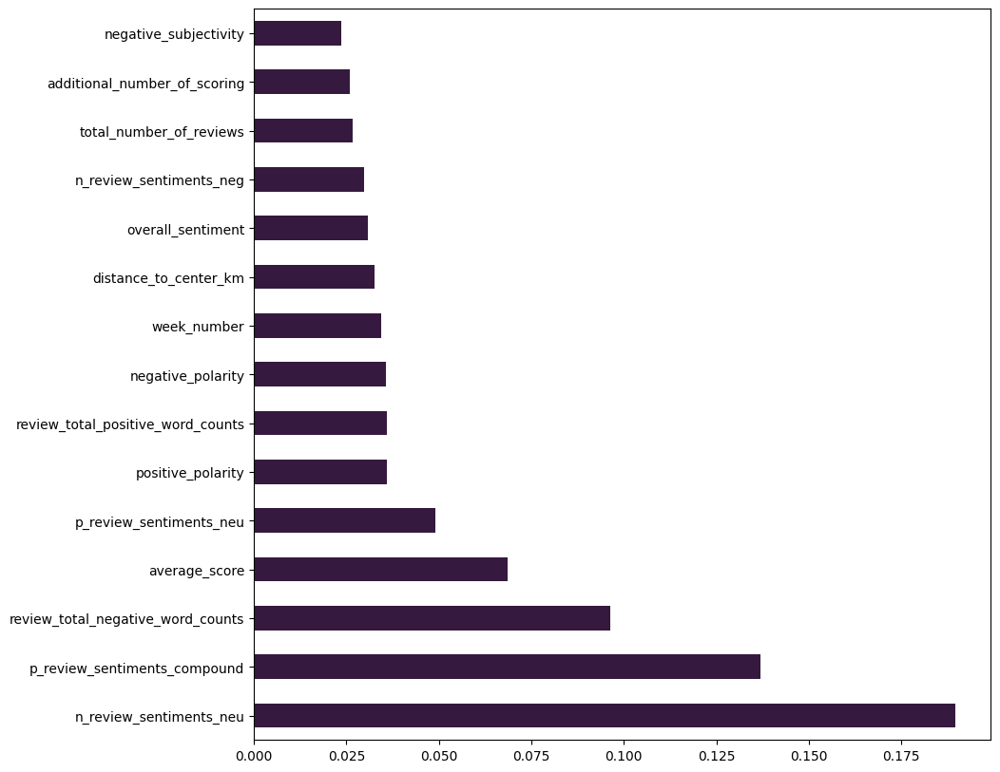

In [ ]:
# важные признаки для модели
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')

In [341]:
test_data.sample(10)

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,year_review,week_number,continent_Asia,...,traveler_type_Solo traveler,traveler_type_Travelers with friends,room_type_category_Apartment,room_type_category_Deluxe,room_type_category_Economy,room_type_category_Family,room_type_category_Luxury,room_type_category_Other,room_type_category_Standard,room_type_category_Suite
42249,317,7.6,37,1458,9,1,0.0,2016,36,True,...,False,False,False,False,False,False,False,False,True,False
46408,275,8.6,52,1470,36,11,0.0,2016,43,False,...,True,False,False,False,False,False,False,False,True,False
97070,166,8.3,12,561,4,4,0.0,2016,43,True,...,True,False,False,False,False,False,False,False,True,False
58443,1831,8.1,8,7105,0,20,0.0,2016,48,False,...,False,False,False,False,False,False,False,False,True,False
35979,440,8.9,32,2574,23,2,0.0,2016,33,True,...,False,False,False,True,False,False,False,False,False,False
88203,391,8.8,0,4887,9,1,0.0,2015,48,True,...,False,False,False,False,False,False,False,False,True,False
12188,241,8.2,50,2500,9,2,0.0,2017,23,False,...,False,False,False,True,False,False,False,False,False,False
47544,444,7.0,0,2061,10,1,0.0,2017,24,False,...,False,False,False,False,False,False,False,False,True,False
78422,545,8.0,31,2907,4,8,0.0,2015,53,False,...,True,False,False,True,False,False,False,False,False,False
118916,69,8.6,38,772,8,1,0.0,2016,35,False,...,False,False,False,False,False,False,False,False,True,False


In [342]:
test_data = test_data.drop(['reviewer_score'], axis=1)

In [343]:
sample_submission

,reviewer_score,id
0,1,488440
1,10,274649
2,3,374688
3,10,404352
4,9,451596
...,...,...
128930,7,495812
128931,1,315577
128932,3,511968
128933,6,303386


In [344]:
predict_submission = model.predict(test_data)

c:\Users\kinde\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done 100 out of 100 | elapsed:    0.0s finished


In [345]:
predict_submission

array([7.742, 7.127, 8.544, ..., 7.717, 9.464, 7.198])

In [346]:
list(sample_submission)

['reviewer_score', 'id']

In [347]:
sample_submission['reviewer_score'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,reviewer_score,id
0,7.742,488440
1,7.127,274649
2,8.544,374688
3,9.351,404352
4,9.426,451596
5,8.196,302161
6,7.498,317079
7,7.609,13963
8,7.052,159785
9,7.563,195089
